<a href="https://colab.research.google.com/github/HolmHS/2026-UKSI-Interview/blob/main/UKSI_Interview_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pdfplumber -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.4/68.4 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 52.4 MB/s eta 0:00:00


In [2]:
import kagglehub
import requests
import re
import pdfplumber
import os
import glob
from google.colab import files

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import seaborn as sns

## Medal Table

In [3]:
# Download 'Olympic Historical Dataset From Olympedia.org'
try:
    path_olympedia = kagglehub.dataset_download("josephcheng123456/olympic-historical-dataset-from-olympediaorg")
    print(f"Path to Olympedia dataset files: {path_olympedia}")
    print(f"Files in Olympedia dataset directory: {os.listdir(path_olympedia)}")
except Exception as e:
    print(f"Failed to download 'Olympic Historical Dataset From Olympedia.org': {e}")

# Download 'Paris 2024 Olympic Summer Games' dataset
try:
    path_paris2024_specific = kagglehub.dataset_download("piterfm/paris-2024-olympic-summer-games")
    print(f"\nPath to Paris 2024 specific dataset files: {path_paris2024_specific}")
    paris_files = os.listdir(path_paris2024_specific)
    print(f"Files in Paris 2024 specific dataset directory: {paris_files}")
except Exception as e:
    print(f"Failed to download 'Paris 2024 Olympic Summer Games' data: {e}")

100%|██████████| 26.6M/26.6M [00:00<00:00, 91.7MB/s]


Extracting files...
Path to Olympedia dataset files: /root/.cache/kagglehub/datasets/josephcheng123456/olympic-historical-dataset-from-olympediaorg/versions/13
Files in Olympedia dataset directory: ['Olympic_Results.csv', 'Olympic_Athlete_Bio.csv', 'Olympics_Games.csv', 'Olympic_Games_Medal_Tally.csv', 'Olympic_Athlete_Event_Results.csv', 'Olympics_Country.csv']


100%|██████████| 2.95M/2.95M [00:00<00:00, 69.6MB/s]

Extracting files...



Path to Paris 2024 specific dataset files: /root/.cache/kagglehub/datasets/piterfm/paris-2024-olympic-summer-games/versions/27
Files in Paris 2024 specific dataset directory: ['athletes.csv', 'technical_officials.csv', 'torch_route.csv', 'coaches.csv', 'schedules_preliminary.csv', 'medals.csv', 'medallists.csv', 'teams.csv', 'venues.csv', 'events.csv', 'results', 'nocs.csv', 'medals_total.csv', 'schedules.csv']


In [4]:
# Load Olympedia data
olympedia_events_path = os.path.join(path_olympedia, 'Olympic_Athlete_Event_Results.csv')
df_olympedia = pd.read_csv(olympedia_events_path)
print("\n--- df_olympedia (Olympedia Events) ---")
display(df_olympedia.head())
df_olympedia.info()

# Load and process Paris 2024 medallists data
try:
    if 'medallists.csv' in paris_files:
        df_paris2024_medallists = pd.read_csv(os.path.join(path_paris2024_specific, 'medallists.csv'))
    else:
        raise FileNotFoundError("medallists.csv not found in the Paris 2024 specific dataset.")

    print("\n--- df_paris2024_medallists (Paris 2024 Medallists Raw) ---")
    display(df_paris2024_medallists.head())
    df_paris2024_medallists.info()

    df_paris2024_processed = df_paris2024_medallists.copy()

    # Explicitly create and map columns to match df_olympedia columns
    df_paris2024_processed['country_noc'] = df_paris2024_processed['country_code']
    df_paris2024_processed['sport'] = df_paris2024_processed['discipline']
    df_paris2024_processed['athlete'] = df_paris2024_processed['name']
    df_paris2024_processed['medal'] = df_paris2024_processed['medal_type']

    # Handle 'athlete_id' from 'code_athlete'
    df_paris2024_processed['athlete_id'] = df_paris2024_processed['code_athlete']

    # Add missing constant columns
    df_paris2024_processed['edition'] = '2024 Summer Olympics'
    df_paris2024_processed['edition_id'] = 999

    # Determine isTeamSport based on 'team' or 'code_team' columns being non-null
    df_paris2024_processed['isTeamSport'] = df_paris2024_processed['team'].notna() | df_paris2024_processed['code_team'].notna()

    # Add missing NaN columns
    df_paris2024_processed['result_id'] = np.nan # Not available in this dataset
    df_paris2024_processed['pos'] = np.nan # Not available in this dataset

    # Ensure medal types are consistent ('Gold', 'Silver', 'Bronze')
    df_paris2024_processed['medal'] = df_paris2024_processed['medal'].str.capitalize()
    df_paris2024_processed['medal'] = df_paris2024_processed['medal'].replace({
        'Gold medal': 'Gold', 'Silver medal': 'Silver', 'Bronze medal': 'Bronze'
    })

    # Define the exact columns and order from df_olympedia
    olympedia_base_cols = df_olympedia.columns.tolist()

    # Select and reorder columns to exactly match df_olympedia's column order
    # This will also drop any extra columns from df_paris2024_medallists that are not in olympedia_base_cols
    df_paris2024_processed = df_paris2024_processed[olympedia_base_cols]

    # Concatenate the original df_olympedia with the processed Paris 2024 data
    df_combined_olympics = pd.concat([df_olympedia, df_paris2024_processed], ignore_index=True)

    print("\n--- Combined Olympic Data (df_combined_olympics) with Paris 2024 ---")
    display(df_combined_olympics.tail())
    df_combined_olympics.info()

except Exception as e:
    print(f"Failed to load or process Paris 2024 medallists data: {e}")
    df_combined_olympics = df_olympedia.copy() # Fallback to original if Paris 2024 fails
    print("Falling back to original df_olympedia for further processing.")


--- df_olympedia (Olympedia Events) ---


,edition,edition_id,country_noc,sport,event,result_id,athlete,athlete_id,pos,medal,isTeamSport
0,1908 Summer Olympics,5,ANZ,Athletics,"100 metres, Men",56265,Ernest Hutcheon,64710,DNS,NaN,False
1,1908 Summer Olympics,5,ANZ,Athletics,"400 metres, Men",56313,Henry Murray,64756,DNS,NaN,False
2,1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Harvey Sutton,64808,3 h8 r1/2,NaN,False
3,1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Guy Haskins,922519,DNS,NaN,False
4,1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338,Joseph Lynch,64735,DNS,NaN,False


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316834 entries, 0 to 316833
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   edition      316834 non-null  object
 1   edition_id   316834 non-null  int64 
 2   country_noc  316834 non-null  object
 3   sport        316834 non-null  object
 4   event        316834 non-null  object
 5   result_id    316834 non-null  int64 
 6   athlete      316834 non-null  object
 7   athlete_id   316834 non-null  int64 
 8   pos          316834 non-null  object
 9   medal        44687 non-null   object
 10  isTeamSport  316834 non-null  bool  
dtypes: bool(1), int64(3), object(7)
memory usage: 24.5+ MB

--- df_paris2024_medallists (Paris 2024 Medallists Raw) ---


,medal_date,medal_type,medal_code,name,gender,country_code,country,country_long,nationality_code,nationality,...,team,team_gender,discipline,event,event_type,url_event,birth_date,code_athlete,code_team,is_medallist
0,2024-07-27,Gold Medal,1.0,EVENEPOEL Remco,Male,BEL,Belgium,Belgium,BEL,Belgium,...,NaN,NaN,Cycling Road,Men's Individual Time Trial,ATH,/en/paris-2024/results/cycling-road/men-s-indi...,2000-01-25,1903136,NaN,True
1,2024-07-27,Silver Medal,2.0,GANNA Filippo,Male,ITA,Italy,Italy,ITA,Italy,...,NaN,NaN,Cycling Road,Men's Individual Time Trial,ATH,/en/paris-2024/results/cycling-road/men-s-indi...,1996-07-25,1923520,NaN,True
2,2024-07-27,Bronze Medal,3.0,van AERT Wout,Male,BEL,Belgium,Belgium,BEL,Belgium,...,NaN,NaN,Cycling Road,Men's Individual Time Trial,ATH,/en/paris-2024/results/cycling-road/men-s-indi...,1994-09-15,1903147,NaN,True
3,2024-07-27,Gold Medal,1.0,BROWN Grace,Female,AUS,Australia,Australia,AUS,Australia,...,NaN,NaN,Cycling Road,Women's Individual Time Trial,ATH,/en/paris-2024/results/cycling-road/women-s-in...,1992-07-07,1940173,NaN,True
4,2024-07-27,Silver Medal,2.0,HENDERSON Anna,Female,GBR,Great Britain,Great Britain,GBR,Great Britain,...,NaN,NaN,Cycling Road,Women's Individual Time Trial,ATH,/en/paris-2024/results/cycling-road/women-s-in...,1998-11-14,1912525,NaN,True


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2315 entries, 0 to 2314
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   medal_date        2315 non-null   object 
 1   medal_type        2315 non-null   object 
 2   medal_code        2314 non-null   float64
 3   name              2315 non-null   object 
 4   gender            2315 non-null   object 
 5   country_code      2315 non-null   object 
 6   country           2315 non-null   object 
 7   country_long      2315 non-null   object 
 8   nationality_code  2314 non-null   object 
 9   nationality       2314 non-null   object 
 10  nationality_long  2314 non-null   object 
 11  team              1555 non-null   object 
 12  team_gender       1555 non-null   object 
 13  discipline        2315 non-null   object 
 14  event             2315 non-null   object 
 15  event_type        2315 non-null   object 
 16  url_event         2294 non-null   object 


,edition,edition_id,country_noc,sport,event,result_id,athlete,athlete_id,pos,medal,isTeamSport
319144,2024 Summer Olympics,999,ITA,Rhythmic Gymnastics,Group All-Around,NaN,CENTOFANTI Martina,1923700,NaN,Bronze,True
319145,2024 Summer Olympics,999,ITA,Rhythmic Gymnastics,Group All-Around,NaN,DURANTI Agnese,1923701,NaN,Bronze,True
319146,2024 Summer Olympics,999,ITA,Rhythmic Gymnastics,Group All-Around,NaN,MAURELLI Alessia,1923699,NaN,Bronze,True
319147,2024 Summer Olympics,999,ITA,Rhythmic Gymnastics,Group All-Around,NaN,MOGUREAN Daniela,1923703,NaN,Bronze,True
319148,2024 Summer Olympics,999,ITA,Rhythmic Gymnastics,Group All-Around,NaN,PARIS Laura,1923704,NaN,Bronze,True


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319149 entries, 0 to 319148
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   edition      319149 non-null  object 
 1   edition_id   319149 non-null  int64  
 2   country_noc  319149 non-null  object 
 3   sport        319149 non-null  object 
 4   event        319149 non-null  object 
 5   result_id    316834 non-null  float64
 6   athlete      319149 non-null  object 
 7   athlete_id   319149 non-null  int64  
 8   pos          316834 non-null  object 
 9   medal        47002 non-null   object 
 10  isTeamSport  319149 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(7)
memory usage: 24.7+ MB


In [5]:
# Use df_combined_olympics for all further processing
df_current_olympics = df_combined_olympics.copy()

# Extract Year from 'edition' and filter for Summer Olympics
df_current_olympics['Year'] = df_current_olympics['edition'].str.extract(r'(\d{4})').astype(int)
df_summer_olympics = df_current_olympics[df_current_olympics['edition'].str.contains('Summer')].copy()

# Fill NaN values in 'medal' column with 'No Medal'
df_summer_olympics['medal'] = df_summer_olympics['medal'].fillna('No Medal')

# Normalise sport and event names to reduce potential overcounting due to variations
df_summer_olympics['sport_normalised'] = df_summer_olympics['sport'].str.lower().str.strip().str.replace(r'\s*\([^\)]*\)', '', regex=True)
df_summer_olympics['event_normalised'] = df_summer_olympics['event'].str.lower().str.strip().str.replace(r'\s*\([^\)]*\)', '', regex=True)

print("DataFrame after extracting Year and filtering for Summer Olympics:")
display(df_summer_olympics.head())
print("\nData Types after initial processing:")
df_summer_olympics.info()

DataFrame after extracting Year and filtering for Summer Olympics:


,edition,edition_id,country_noc,sport,event,result_id,athlete,athlete_id,pos,medal,isTeamSport,Year,sport_normalised,event_normalised
0,1908 Summer Olympics,5,ANZ,Athletics,"100 metres, Men",56265.0,Ernest Hutcheon,64710,DNS,No Medal,False,1908,athletics,"100 metres, men"
1,1908 Summer Olympics,5,ANZ,Athletics,"400 metres, Men",56313.0,Henry Murray,64756,DNS,No Medal,False,1908,athletics,"400 metres, men"
2,1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338.0,Harvey Sutton,64808,3 h8 r1/2,No Medal,False,1908,athletics,"800 metres, men"
3,1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338.0,Guy Haskins,922519,DNS,No Medal,False,1908,athletics,"800 metres, men"
4,1908 Summer Olympics,5,ANZ,Athletics,"800 metres, Men",56338.0,Joseph Lynch,64735,DNS,No Medal,False,1908,athletics,"800 metres, men"



Data Types after initial processing:
<class 'pandas.core.frame.DataFrame'>
Index: 256973 entries, 0 to 319148
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   edition           256973 non-null  object 
 1   edition_id        256973 non-null  int64  
 2   country_noc       256973 non-null  object 
 3   sport             256973 non-null  object 
 4   event             256973 non-null  object 
 5   result_id         254658 non-null  float64
 6   athlete           256973 non-null  object 
 7   athlete_id        256973 non-null  int64  
 8   pos               254658 non-null  object 
 9   medal             256973 non-null  object 
 10  isTeamSport       256973 non-null  bool   
 11  Year              256973 non-null  int64  
 12  sport_normalised  256973 non-null  object 
 13  event_normalised  256973 non-null  object 
dtypes: bool(1), float64(1), int64(3), object(9)
memory usage: 27.7+ MB


In [6]:
# Process Medals
df_medals_only = df_summer_olympics[df_summer_olympics['medal'].isin(['Gold', 'Silver', 'Bronze'])].copy()
df_individual = df_medals_only[df_medals_only['isTeamSport'] == False].copy()
df_indiv_counted = df_individual.drop_duplicates(subset=['Year', 'country_noc', 'sport_normalised', 'event_normalised', 'athlete', 'medal'])
df_team = df_medals_only[df_medals_only['isTeamSport'] == True].copy()
df_team_counted = df_team.drop_duplicates(subset=['Year', 'country_noc', 'sport_normalised', 'event_normalised', 'medal'])
df_counted_medals = pd.concat([df_indiv_counted, df_team_counted], ignore_index=True)

# Final Tally
medals_by_country_year = df_counted_medals.groupby(['Year', 'country_noc', 'medal']).size().unstack(fill_value=0).reset_index()
medal_cols = ['Gold', 'Silver', 'Bronze']
for col in medal_cols:
    if col not in medals_by_country_year.columns: medals_by_country_year[col] = 0

medals_by_country_year['Total'] = medals_by_country_year[medal_cols].sum(axis=1)
medals_by_country_year.rename(columns={'country_noc': 'NOC'}, inplace=True)
medals_by_country_year = medals_by_country_year[['Year', 'NOC'] + medal_cols + ['Total']]

print("Verified Team GB 1900 Tally after removing specific mixed/reallocated medals:")
display(medals_by_country_year[(medals_by_country_year['NOC'] == 'GBR') & (medals_by_country_year['Year'] == 1900)])

Verified Team GB 1900 Tally after removing specific mixed/reallocated medals:


medal,Year,NOC,Gold,Silver,Bronze,Total
18,1900,GBR,20,9,10,39


In [7]:
team_gb_medals = medals_by_country_year[
    (medals_by_country_year['NOC'] == 'GBR') &
    (medals_by_country_year['Year'] >= 1996) # Filter for Team GB, years 1996 onwards
].copy()

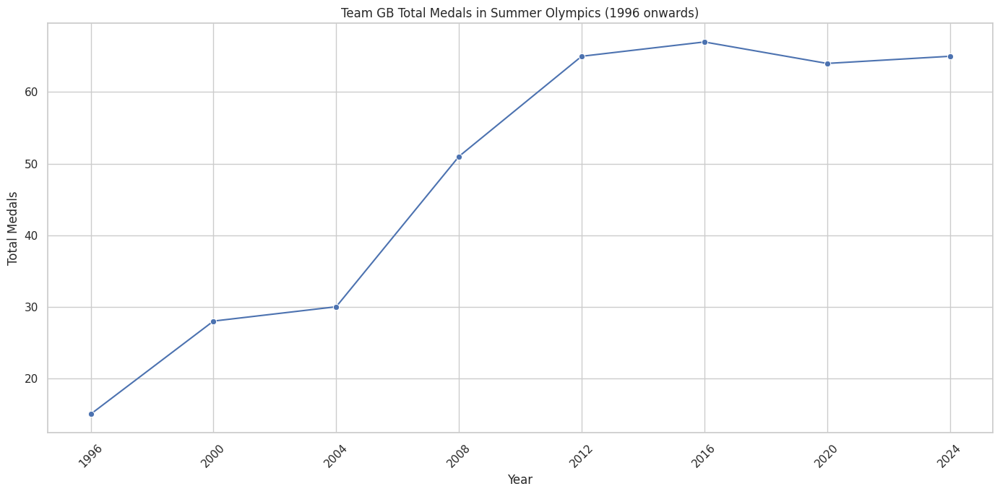

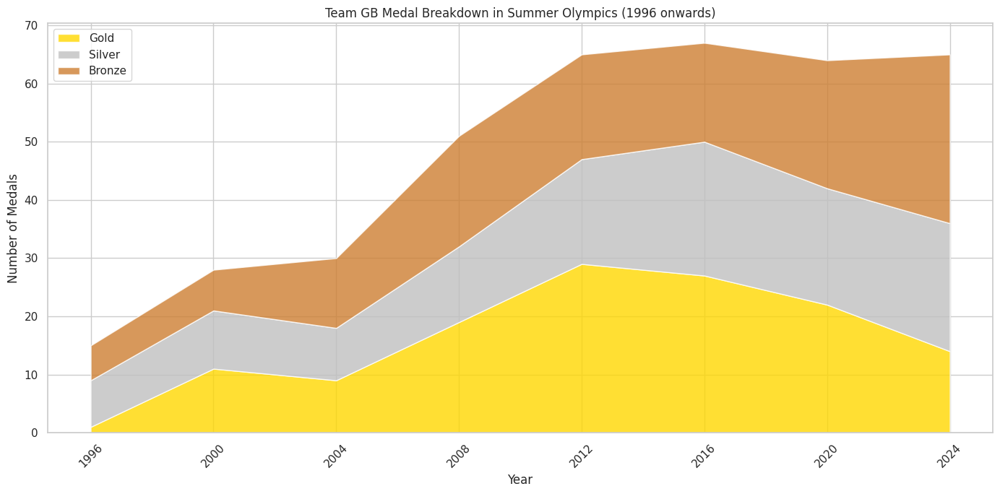

In [8]:
# Set the style for the plots
sns.set_theme(style="whitegrid")

# Plot Team GB's total medal count over time
plt.figure(figsize=(14, 7))
sns.lineplot(data=team_gb_medals, x='Year', y='Total', marker='o')
plt.title('Team GB Total Medals in Summer Olympics (1996 onwards)')
plt.xlabel('Year')
plt.ylabel('Total Medals')
plt.xticks(team_gb_medals['Year'].unique(), rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot Team GB's medal breakdown (Gold, Silver, Bronze) over time
plt.figure(figsize=(14, 7))
plt.stackplot(team_gb_medals['Year'],
              team_gb_medals['Gold'],
              team_gb_medals['Silver'],
              team_gb_medals['Bronze'],
              labels=['Gold', 'Silver', 'Bronze'],
              colors=['gold', 'silver', '#CD7F32'],
              alpha=0.8)
plt.title('Team GB Medal Breakdown in Summer Olympics (1996 onwards)')
plt.xlabel('Year')
plt.ylabel('Number of Medals')
plt.legend(loc='upper left')
plt.xticks(team_gb_medals['Year'].unique(), rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [9]:
# Identify the most recent Olympic year in our dataset for comparison context
latest_year = medals_by_country_year['Year'].max()
print(f"Latest Olympic year in dataset: {latest_year}")

# Get Team GB's performance in the latest Olympic year
team_gb_latest = medals_by_country_year[(medals_by_country_year['NOC'] == 'GBR') & (medals_by_country_year['Year'] == latest_year)]
if not team_gb_latest.empty:
    gb_total_medals_latest = team_gb_latest['Total'].iloc[0]
    print(f"Team GB total medals in {latest_year}: {gb_total_medals_latest}")
else:
    gb_total_medals_latest = 0
    print(f"Team GB data not found for {latest_year}.")

# Find countries with similar total medal tallies around the latest year
medal_tolerance_percentage = 0.30 # 30% tolerance

lower_bound = gb_total_medals_latest * (1 - medal_tolerance_percentage)
upper_bound = gb_total_medals_latest * (1 + medal_tolerance_percentage)

similar_medal_nations = medals_by_country_year[
    (medals_by_country_year['Year'] == latest_year) &
    (medals_by_country_year['Total'] >= lower_bound) &
    (medals_by_country_year['Total'] <= upper_bound) &
    (medals_by_country_year['NOC'] != 'GBR') # Exclude Team GB itself
].sort_values(by='Total', ascending=False)

print(f"\nNations with similar medal tallies (within +/- {medal_tolerance_percentage*100}%) to Team GB ({gb_total_medals_latest} medals) in {latest_year}:")
display(similar_medal_nations.head(10))

Latest Olympic year in dataset: 2024
Team GB total medals in 2024: 65

Nations with similar medal tallies (within +/- 30.0%) to Team GB (65 medals) in 2024:


medal,Year,NOC,Gold,Silver,Bronze,Total
1373,2024,FRA,16,26,22,64
1346,2024,AUS,18,19,16,53


In [10]:
# Filter df_counted_medals for Team GB AND for years 2000 onwards
gbr_medals_by_sport = df_counted_medals[
    (df_counted_medals['country_noc'] == 'GBR') &
    (df_counted_medals['Year'] >= 2000)
].copy()

# Group by sport and medal to count medals
sport_medal_counts = gbr_medals_by_sport.groupby(['sport', 'medal']).size().unstack(fill_value=0).reset_index()

# Ensure all medal columns exist, fill with 0 if not
for col in ['Gold', 'Silver', 'Bronze']:
    if col not in sport_medal_counts.columns:
        sport_medal_counts[col] = 0

# Calculate total medals for each sport
sport_medal_counts['Total'] = sport_medal_counts[['Gold', 'Silver', 'Bronze']].sum(axis=1)

# Sort by total medals in descending order
sport_medal_counts_sorted = sport_medal_counts.sort_values(by='Total', ascending=False)

print("Top Sports for Team GB by Total Medals (2000 onwards):")
display(sport_medal_counts_sorted.head(10))

Top Sports for Team GB by Total Medals (2000 onwards):


medal,sport,Bronze,Gold,Silver,Total
12,Cycling Track,12,27,16,55
3,Athletics,20,13,13,46
23,Rowing,10,15,12,37
25,Sailing,5,16,10,31
29,Swimming,6,8,13,27
5,Boxing,7,8,5,20
1,Artistic Gymnastics,10,3,2,15
13,Diving,8,2,3,13
6,Canoe Slalom,3,2,8,13
34,Triathlon,4,4,3,11


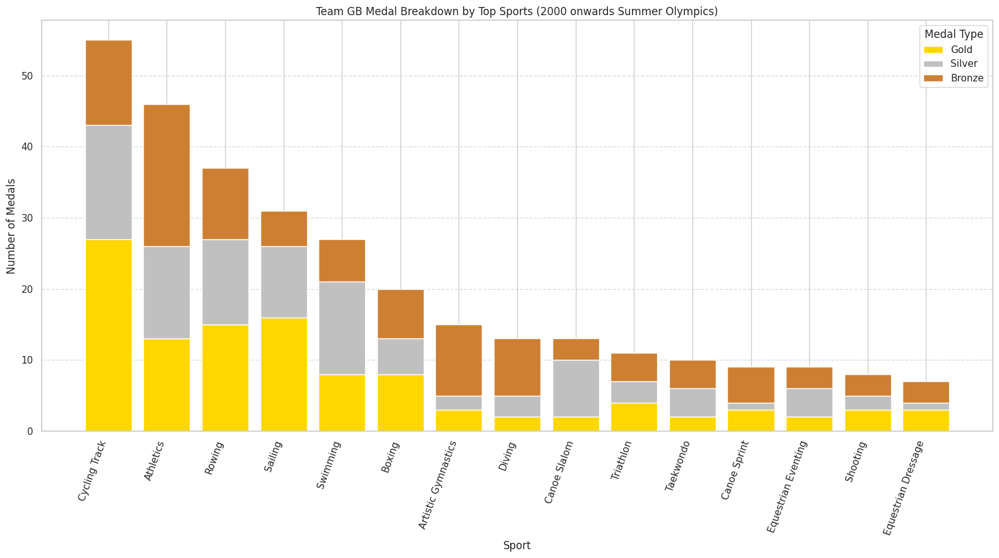

In [11]:
# Prepare data for plotting (top N sports, e.g., top 15)
top_n_sports = sport_medal_counts_sorted.head(15)

# Create a stacked bar chart for medal breakdown by sport
plt.figure(figsize=(16, 9))

# Stacked bar chart
bottom_gold = top_n_sports['Gold']
bottom_silver = bottom_gold + top_n_sports['Silver']

plt.bar(top_n_sports['sport'], top_n_sports['Gold'], color='gold', label='Gold')
plt.bar(top_n_sports['sport'], top_n_sports['Silver'], bottom=bottom_gold, color='silver', label='Silver')
plt.bar(top_n_sports['sport'], top_n_sports['Bronze'], bottom=bottom_silver, color='#CD7F32', label='Bronze')

plt.title('Team GB Medal Breakdown by Top Sports (2000 onwards Summer Olympics)')
plt.xlabel('Sport')
plt.ylabel('Number of Medals')
plt.xticks(rotation=70, ha='right')
plt.legend(title='Medal Type')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

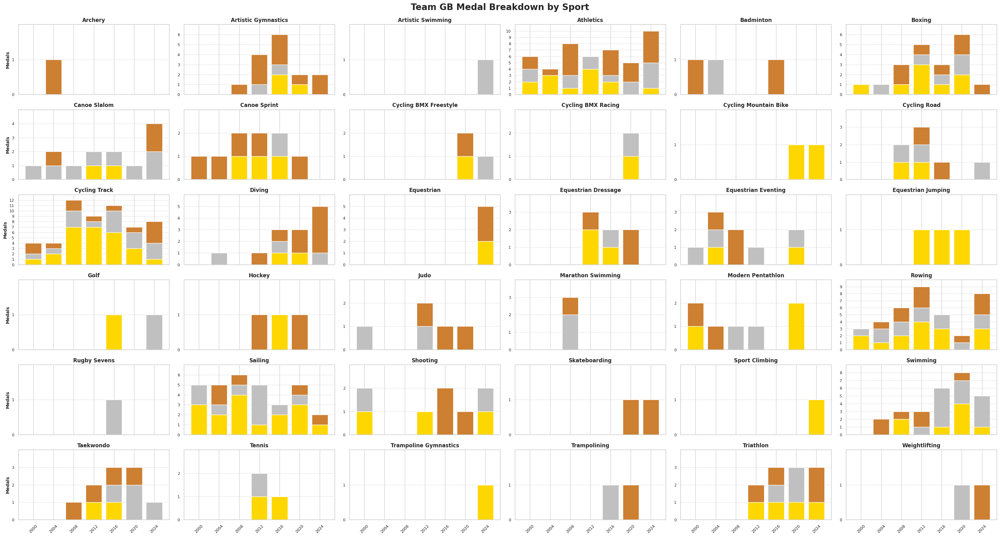

In [12]:
# Filter df_counted_medals for Team GB from 2000 onwards
gbr_medals_since_2000 = df_counted_medals[
    (df_counted_medals['country_noc'] == 'GBR') &
    (df_counted_medals['Year'] >= 2000)
].copy()

# Get all unique Olympic years from 2000 onwards that are present in the dataset
all_olympic_years = sorted(df_counted_medals[df_counted_medals['Year'] >= 2000]['Year'].unique())

# Get unique sports for Team GB in this period
unique_sports_gbr = sorted(gbr_medals_since_2000['sport'].unique())

# Determine grid size for subplots
num_sports = len(unique_sports_gbr)
n_cols = 6
n_rows = int(np.ceil(num_sports / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(32, 18), sharex=True)
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

for i, sport_name in enumerate(unique_sports_gbr):
    ax = axes[i]

    # Filter data for the current sport
    sport_data = gbr_medals_since_2000[gbr_medals_since_2000['sport'] == sport_name].copy()

    # Group by year and medal to get counts
    sport_medal_tally = sport_data.groupby(['Year', 'medal']).size().unstack(fill_value=0).reset_index()

    # Ensure all medal columns exist
    for col in ['Gold', 'Silver', 'Bronze']:
        if col not in sport_medal_tally.columns:
            sport_medal_tally[col] = 0

    # Create a DataFrame with all years from 2000 onwards for the current sport
    full_year_df = pd.DataFrame({'Year': all_olympic_years})
    sport_medal_tally_complete = pd.merge(full_year_df, sport_medal_tally, on='Year', how='left').fillna(0)

    # Convert medal counts to integer
    for col in ['Gold', 'Silver', 'Bronze']:
        sport_medal_tally_complete[col] = sport_medal_tally_complete[col].astype(int)

    # Sort by year to ensure correct plotting order
    sport_medal_tally_complete = sport_medal_tally_complete.sort_values(by='Year')

    # Stacked bar chart for the specific sport
    bottom_gold = sport_medal_tally_complete['Gold']
    bottom_silver = bottom_gold + sport_medal_tally_complete['Silver']

    ax.bar(sport_medal_tally_complete['Year'].astype(str), sport_medal_tally_complete['Gold'], color='gold', label='Gold')
    ax.bar(sport_medal_tally_complete['Year'].astype(str), sport_medal_tally_complete['Silver'], bottom=bottom_gold, color='silver', label='Silver')
    ax.bar(sport_medal_tally_complete['Year'].astype(str), sport_medal_tally_complete['Bronze'], bottom=bottom_silver, color='#CD7F32', label='Bronze')

    ax.set_title(f'{sport_name}', fontsize=12, fontweight='bold')
    if i % n_cols == 0: # Only show ylabel for the first subplot in each row
        ax.set_ylabel('Medals', fontsize=10, fontweight='bold')
    else:
        ax.set_ylabel('') # Empty label for other subplots
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Adjust ylim and yticks dynamically for each subplot
    max_medals_in_sport = (sport_medal_tally_complete['Gold'] + sport_medal_tally_complete['Silver'] + sport_medal_tally_complete['Bronze']).max()
    if max_medals_in_sport > 0:
        ax.set_ylim(0, max_medals_in_sport + 1)
        ax.set_yticks(range(int(max_medals_in_sport) + 1))
    else:
        ax.set_ylim(0, 1)
        ax.set_yticks([0, 1])

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Team GB Medal Breakdown by Sport', fontsize=20, y=0.98, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.savefig('TeamGB_Sport_Trends.png')
plt.show()

In [13]:
gbr_all_participated_sports = df_summer_olympics[
    (df_summer_olympics['country_noc'] == 'GBR') &
    (df_summer_olympics['Year'] >= 2000)
]['sport'].unique()

# Convert to sets for easy comparison
participated_sports_set = set(gbr_all_participated_sports)
medaled_sports_set = set(unique_sports_gbr)

# Find sports in which Team GB participated but did not medal
non_medaled_sports = participated_sports_set - medaled_sports_set

if non_medaled_sports:
    print("Team GB participated in the following sports since 2000 but did not win a medal:")
    for sport in sorted(list(non_medaled_sports)):
        print(f"- {sport}")
else:
    print("Team GB has won at least one medal in every sport they participated in since 2000 that is currently in the plotted data.")

Team GB participated in the following sports since 2000 but did not win a medal:
- Basketball
- Beach Volleyball
- Fencing
- Football
- Handball
- Rhythmic Gymnastics
- Table Tennis
- Volleyball
- Water Polo
- Wrestling
- Wushu


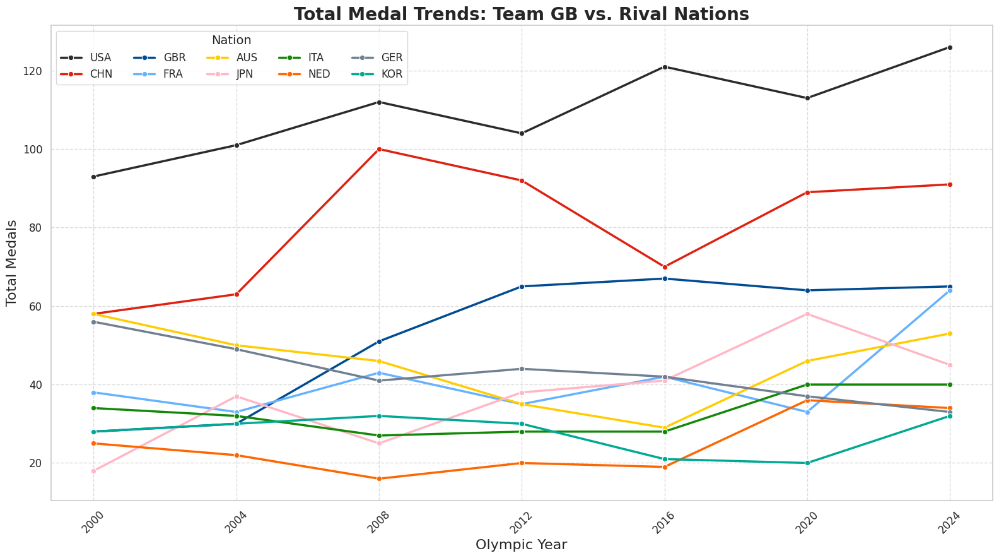

In [14]:
# Get the list of rival nations (NOCs) from the user's request
rival_nations_nocs = ['AUS', 'CHN', 'FRA', 'GER', 'ITA', 'USA', 'JPN', 'KOR', 'NED']

# Include Team GB in the list for comparison
comparison_nations = ['GBR'] + rival_nations_nocs

# Filter the main medals_by_country_year DataFrame for these nations and years >= 2000
comparative_medal_trends = medals_by_country_year[
    (medals_by_country_year['NOC'].isin(comparison_nations)) &
    (medals_by_country_year['Year'] >= 2000)
].copy()

# Define the custom color palette
custom_palette = {
    'AUS': '#FFCC00',
    'CHN': '#DE2110',
    'FRA': '#66B2FF',
    'GBR': '#004B91',
    'GER': '#708090',
    'ITA': '#138808',
    'USA': '#2B2B2B',
    'JPN': '#FFB7C5',
    'KOR': '#00A896',
    'NED': '#FF6600'
}

# Determine order for legend based on 2024 total medals
medals_2024 = comparative_medal_trends[comparative_medal_trends['Year'] == 2024]
legend_order = medals_2024.sort_values(by='Total', ascending=False)['NOC'].tolist()

# Reorder the custom_palette based on legend_order
sorted_palette = {noc: custom_palette[noc] for noc in legend_order if noc in custom_palette}

plt.figure(figsize=(16, 9))
sns.lineplot(data=comparative_medal_trends, x='Year', y='Total', hue='NOC', marker='o', palette=sorted_palette, hue_order=legend_order, linewidth=2.5)
plt.title('Total Medal Trends: Team GB vs. Rival Nations', fontsize=20, fontweight='bold')
plt.xlabel('Olympic Year', fontsize=16)
plt.ylabel('Total Medals', fontsize=16)
plt.xticks(comparative_medal_trends['Year'].unique(), rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Nation', loc='best', ncols=5, fontsize=12, title_fontsize=14)
plt.tight_layout()
plt.savefig('Medal_Comparison.png')
plt.show()

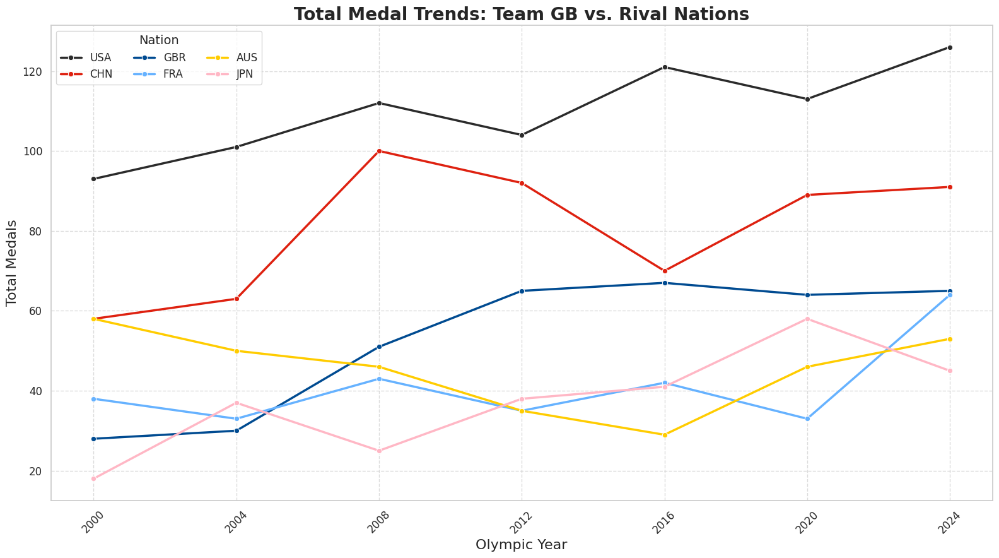

In [15]:
# Define the new list of nations for comparison
comparison_nations_selected = ['USA', 'CHN', 'GBR', 'FRA', 'AUS', 'JPN']

# Filter the main medals_by_country_year DataFrame for these nations and years >= 2000
comparative_medal_trends_selected = medals_by_country_year[
    (medals_by_country_year['NOC'].isin(comparison_nations_selected)) &
    (medals_by_country_year['Year'] >= 2000)
].copy()

# Determine order for legend based on 2024 total medals for the selected nations
medals_2024_selected = comparative_medal_trends_selected[comparative_medal_trends_selected['Year'] == 2024]
legend_order_selected = medals_2024_selected.sort_values(by='Total', ascending=False)['NOC'].tolist()

# Reorder the custom_palette based on legend_order_selected
sorted_palette_selected = {noc: custom_palette[noc] for noc in legend_order_selected if noc in custom_palette}

plt.figure(figsize=(16, 9))
sns.lineplot(
    data=comparative_medal_trends_selected,
    x='Year',
    y='Total',
    hue='NOC',
    marker='o',
    palette=sorted_palette_selected,
    hue_order=legend_order_selected,
    linewidth=2.5
)
plt.title('Total Medal Trends: Team GB vs. Rival Nations', fontsize=20, fontweight='bold')
plt.xlabel('Olympic Year', fontsize=16)
plt.ylabel('Total Medals', fontsize=16)
plt.xticks(comparative_medal_trends_selected['Year'].unique(), rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Nation', loc='best', ncols=3, fontsize=12, title_fontsize=14)
plt.tight_layout()
plt.savefig('Medal_Comparison_Selected_Nations.png')
plt.show()

## Track Cycling: Men's Team Pursuit

In [16]:
# Updated event data for 2021-2026
events_config = {
    "2021": {
        "0003130102010801FFFFFFFFFFFFFF03": "2021_Cali_Qualifying",
        "0003130102010802FFFFFFFFFFFFFF03": "2021_Cali_First_Round",
        "0003130102010803FFFFFFFFFFFFFF02": "2021_Cali_Finals",
        "0003130105010A01FFFFFFFFFFFFFF03": "2021_Grenchen_Qualifying",
        "0003130105010A02FFFFFFFFFFFFFF03": "2021_Grenchen_First_Round",
        "0003130105010A03FFFFFFFFFFFFFF02": "2021_Grenchen_Finals",
        "0003130103010A01FFFFFFFFFFFFFF03": "2021_Roubaix_Qualifying",
        "0003130103010A02FFFFFFFFFFFFFF03": "2021_Roubaix_First_Round",
        "0003130103010A03FFFFFFFFFFFFFF02": "2021_Roubaix_Finals",
    },
    "2022": {
        "0003140200010801FFFFFFFFFFFFFF03": "2022_Glasgow_Qualifying",
        "0003140200010802FFFFFFFFFFFFFF03": "2022_Glasgow_First_Round",
        "0003140200010803FFFFFFFFFFFFFF02": "2022_Glasgow_Finals",
        "0003140201010901FFFFFFFFFFFFFF03": "2022_Milton_Qualifying",
        "0003140201010902FFFFFFFFFFFFFF03": "2022_Milton_First_Round",
        "0003140201010903FFFFFFFFFFFFFF02": "2022_Milton_Finals",
        "0003140202010801FFFFFFFFFFFFFF03": "2022_Cali_Qualifying",
        "0003140202010802FFFFFFFFFFFFFF03": "2022_Cali_First_Round",
        "0003140202010803FFFFFFFFFFFFFF02": "2022_Cali_Finals",
        "https://www.ec2022results.com/webrelease/resECM2022/pdf/ECM2022/CTR/ECM2022_CTR_C77B_CTRMPURTEAM4----------QUAL--------.pdf": "2022_Munich_Qualifying",
        "https://ec2022results.com/webrelease/resECM2022/pdf/ECM2022/CTR/ECM2022_CTR_C77B_CTRMPURTEAM4----------RND1--------.pdf": "2022_Munich_First_Round",
        "https://www.ec2022results.com/webrelease/resECM2022/pdf/ECM2022/CTR/ECM2022_CTR_C77B_CTRMPURTEAM4----------FNL---------.pdf": "2022_Munich_Finals",
        "0003140203010A01FFFFFFFFFFFFFF03": "2022_SQY_Qualifying",
        "0003140203010A02FFFFFFFFFFFFFF03": "2022_SQY_First_Round",
        "0003140203010A03FFFFFFFFFFFFFF02": "2022_SQY_Finals",
    },
    "2023": {
        "0003160104010A01FFFFFFFFFFFFFF03": "2023_Grenchen_Qualifying",
        "0003160104010A02FFFFFFFFFFFFFF03": "2023_Grenchen_First_Round",
        "0003160104010A03FFFFFFFFFFFFFF02": "2023_Grenchen_Finals",
        "0003160101010601FFFFFFFFFFFFFF03": "2023_Jakarta_Qualifying",
        "0003160101010602FFFFFFFFFFFFFF03": "2023_Jakarta_First_Round",
        "0003160101010603FFFFFFFFFFFFFF02": "2023_Jakarta_Finals",
        "0003160102010601FFFFFFFFFFFFFF03": "2023_Cairo_Qualifying",
        "0003160102010602FFFFFFFFFFFFFF03": "2023_Cairo_First_Round",
        "0003160102010603FFFFFFFFFFFFFF02": "2023_Cairo_Finals",
        "0003160103010601FFFFFFFFFFFFFF03": "2023_Milton_Qualifying",
        "0003160103010602FFFFFFFFFFFFFF03": "2023_Milton_First_Round",
        "0003160103010603FFFFFFFFFFFFFF02": "2023_Milton_Finals",
        "0003160100010A01FFFFFFFFFFFFFF03": "2023_Glasgow_Qualifying",
        "0003160100010A02FFFFFFFFFFFFFF03": "2023_Glasgow_First_Round",
        "0003160100010A03FFFFFFFFFFFFFF02": "2023_Glasgow_Finals",
    },
    "2024": {
        "0003170100010A01FFFFFFFFFFFFFF03": "2024_Apeldoorn_Qualifying",
        "0003170100010A02FFFFFFFFFFFFFF03": "2024_Apeldoorn_First_Round",
        "0003170100010A03FFFFFFFFFFFFFF02": "2024_Apeldoorn_Finals",
        "0003170101010601FFFFFFFFFFFFFF03": "2024_Adelaide_Qualifying",
        "0003170101010602FFFFFFFFFFFFFF03": "2024_Adelaide_First_Round",
        "0003170101010603FFFFFFFFFFFFFF02": "2024_Adelaide_Finals",
        "0003170102010601FFFFFFFFFFFFFF03": "2024_Hong_Kong_Qualifying",
        "0003170102010602FFFFFFFFFFFFFF03": "2024_Hong_Kong_First_Round",
        "0003170102010603FFFFFFFFFFFFFF02": "2024_Hong_Kong_Finals",
        "0003170103010601FFFFFFFFFFFFFF03": "2024_Milton_Qualifying",
        "0003170103010602FFFFFFFFFFFFFF03": "2024_Milton_First_Round",
        "0003170103010603FFFFFFFFFFFFFF02": "2024_Milton_Finals",
        "https://assets.ctfassets.net/761l7gh5x5an/7BbspOVZFQv5kTUePoX2om/26e8090163553edf4d547aecbfd08c54/2024-Cycling_Track.pdf": "2024_Paris_Olympics",
        "0003170104010A01FFFFFFFFFFFFFF03": "2024_Ballerup_Qualifying",
        "0003170104010A02FFFFFFFFFFFFFF03": "2024_Ballerup_First_Round",
        "0003170104010A03FFFFFFFFFFFFFF02": "2024_Ballerup_Finals",
    },
    "2025": {
        "0003180102010A01FFFFFFFFFFFFFF03": "2025_Heusden_Qualifying",
        "0003180102010A02FFFFFFFFFFFFFF03": "2025_Heusden_First_Round",
        "0003180102010A03FFFFFFFFFFFFFF02": "2025_Heusden_Finals",
        "0003180100010601FFFFFFFFFFFFFF03": "2025_Konya_Qualifying",
        "0003180100010602FFFFFFFFFFFFFF03": "2025_Konya_First_Round",
        "0003180100010603FFFFFFFFFFFFFF02": "2025_Konya_Finals",
        "0003180101010A01FFFFFFFFFFFFFF03": "2025_Santiago_Qualifying",
        "0003180101010A02FFFFFFFFFFFFFF03": "2025_Santiago_First_Round",
        "0003180101010A03FFFFFFFFFFFFFF02": "2025_Santiago_Finals",
    },
    "2026": {
        "0003190100010A01FFFFFFFFFFFFFF03": "2026_Konya_Qualifying",
        "0003190100010A02FFFFFFFFFFFFFF03": "2026_Konya_First_Round",
        "0003190100010A03FFFFFFFFFFFFFF02": "2026_Konya_Finals",
        "0003190101010601FFFFFFFFFFFFFF03": "2026_Perth_Qualifying",
        "0003190101010602FFFFFFFFFFFFFF03": "2026_Perth_First_Round",
        "0003190101010603FFFFFFFFFFFFFF02": "2026_Perth_Finals",
        "0003190102010601FFFFFFFFFFFFFF03": "2026_Hong_Kong_Qualifying",
        "0003190102010602FFFFFFFFFFFFFF03": "2026_Hong_Kong_First_Round",
        "0003190102010603FFFFFFFFFFFFFF02": "2026_Hong_Kong_Finals",
        "0003190103010601FFFFFFFFFFFFFF03": "2026_Nilai_Qualifying",
        "0003190103010602FFFFFFFFFFFFFF03": "2026_Nilai_First_Round",
        "0003190103010603FFFFFFFFFFFFFF02": "2026_Nilai_Finals",
    }
}

def quick_download(year, file_id, event_name):
    if file_id.startswith('http'):
        url = file_id
    else:
        base_url = "https://prod.server.tissottiming.com/file/"
        url = f"{base_url}{file_id}"

    output_dir = f'uci_timing_sheets/{year}'
    os.makedirs(output_dir, exist_ok=True)
    filepath = os.path.join(output_dir, f"{event_name}.pdf")

    if os.path.exists(filepath):
        return filepath

    print(f"Fetching: {event_name}...")
    try:
        headers = {'User-Agent': 'Mozilla/5.0'}
        with requests.get(url, stream=True, headers=headers) as r:
            r.raise_for_status()
            with open(filepath, 'wb') as f:
                for chunk in r.iter_content(chunk_size=8192):
                    f.write(chunk)
        return filepath
    except Exception as e:
        print(f"Failed {event_name}: {e}")
        return None

pdf_files = []
for year, events in events_config.items():
    for fid, name in events.items():
        path = quick_download(year, fid, name)
        if path: pdf_files.append((path, name, year))

print(f"Ready to process {len(pdf_files)} files.")

Fetching: 2021_Cali_Qualifying...
Fetching: 2021_Cali_First_Round...
Fetching: 2021_Cali_Finals...
Fetching: 2021_Grenchen_Qualifying...
Fetching: 2021_Grenchen_First_Round...
Fetching: 2021_Grenchen_Finals...
Fetching: 2021_Roubaix_Qualifying...
Fetching: 2021_Roubaix_First_Round...
Fetching: 2021_Roubaix_Finals...
Fetching: 2022_Glasgow_Qualifying...
Fetching: 2022_Glasgow_First_Round...
Fetching: 2022_Glasgow_Finals...
Fetching: 2022_Milton_Qualifying...
Fetching: 2022_Milton_First_Round...
Fetching: 2022_Milton_Finals...
Fetching: 2022_Cali_Qualifying...
Fetching: 2022_Cali_First_Round...
Fetching: 2022_Cali_Finals...
Fetching: 2022_Munich_Qualifying...
Fetching: 2022_Munich_First_Round...
Fetching: 2022_Munich_Finals...
Fetching: 2022_SQY_Qualifying...
Fetching: 2022_SQY_First_Round...
Fetching: 2022_SQY_Finals...
Fetching: 2023_Grenchen_Qualifying...
Fetching: 2023_Grenchen_First_Round...
Fetching: 2023_Grenchen_Finals...
Fetching: 2023_Jakarta_Qualifying...
Fetching: 2023_Jakart

In [17]:
def clean_uci_table(df, is_munich_r1=False, is_ballerup_r1=False, is_konya_qual=False, event_name=""):
    clean_data = []
    # Noise filters for 2022 Munich First Round
    munich_r1_filters = {
        'POL - POLAND': [1000, 1500, 1600],
        'SUI - SWITZERLAND': [1000, 1100, 1400, 1500, 1600, 1700],
        'FRA - FRANCE': [1000, 1100, 2000, 2100, 2300],
        'GBR - GREAT BRITAIN': [900, 1000, 2100, 2200]
    }

    for col in df.columns:
        if col is not None and isinstance(col, str) and 'Distance' in col:
            team_name = str(col).split('\n')[0].strip()
            raw_text = df[col].iloc[0]
            if not isinstance(raw_text, str): continue

            matches = re.findall(r'(\d+m)\s+([\d:.]+)\s+(\d+)', raw_text)
            for match in matches:
                dist_str, time_val, rank_raw = match
                dist_num = int(dist_str.replace('m', ''))

                # --- CONSOLIDATED MANUAL FILTERS ---

                # Munich R1 specific noise filters
                if is_munich_r1:
                    if team_name in munich_r1_filters and dist_num in munich_r1_filters[team_name]:
                        continue

                # Ballerup R1 specific filters
                if is_ballerup_r1:
                    if 'GER' in team_name and dist_num == 1500: continue
                    if 'DEN' in team_name and dist_num in [2875, 3000]: continue
                    # Added filter for CAN 500m error
                    if 'CAN' in team_name and dist_num == 500: continue

                # Konya 2026 Qualifying: Switzerland error
                if is_konya_qual:
                    if 'SUI' in team_name.upper() and dist_num == 875: continue

                # Cairo 2023 Finals: Denmark OVL split
                if "2023_Cairo_Finals" in event_name:
                    if 'DEN' in team_name and dist_num == 2625: continue

                # Milton 2022 First Round: Australia OVL split
                if "2022_Milton_First_Round" in event_name:
                    if 'AUS' in team_name and dist_num == 2625: continue

                # Cali 2022 First Round: Italy OVL splits
                if "2022_Cali_First_Round" in event_name:
                    if 'ITA' in team_name and dist_num in [3500, 3625]: continue

                if not time_val or time_val == '.' or time_val == '':
                    continue

                clean_data.append({
                    'Team': team_name,
                    'Distance': dist_str,
                    'Time': time_val,
                    'Rank_Raw': int(rank_raw)
                })
    return pd.DataFrame(clean_data)

In [18]:
def process_pdf(pdf_path, event_name, year):
    target_dir = f'cleaned_csv_data/{year}'
    os.makedirs(target_dir, exist_ok=True)

    is_munich_r1 = "Munich_First_Round" in event_name
    is_ballerup_r1 = "Ballerup_First_Round" in event_name
    is_konya_qual = "Konya_Qualifying" in event_name
    is_paris = "Paris_Olympics" in event_name

    event_data_map = {}

    with pdfplumber.open(pdf_path) as pdf:
        for i, page in enumerate(pdf.pages):
            page_num = i + 1
            text = page.extract_text() or ""

            if is_paris:
                paris_p = [99,100,101,102,107,108,109,110,115,116,117,118,119]
                if page_num not in paris_p: continue
                if "Men's Team Pursuit" not in text or "Women's Team Pursuit" in text: continue

            current_event_name = event_name
            if is_paris:
                if "First Round" in text: current_event_name = "2024_Paris_First_Round"
                elif "Finals" in text or "Medal Finals" in text or "Classification" in text: current_event_name = "2024_Paris_Finals"
                else: current_event_name = "2024_Paris_Qualifying"

            heat_type = "Unknown"
            if "Finals" in current_event_name:
                t_upper = text.upper()
                if "GOLD" in t_upper or "FINAL FOR GOLD" in t_upper: heat_type = "Gold/Silver"
                elif "BRONZE" in t_upper or "FINAL FOR BRONZE" in t_upper: heat_type = "Bronze"
                elif "5-6" in text or "PLACES 5-6" in t_upper or "FOR 5TH" in t_upper: heat_type = "5-6 Placement"
                elif "7-8" in text or "PLACES 7-8" in t_upper or "FOR 7TH" in t_upper: heat_type = "7-8 Placement"

            if current_event_name not in event_data_map: event_data_map[current_event_name] = []

            settings = {"vertical_strategy": "lines"}
            tables = page.extract_tables(table_settings=settings if "Munich" in event_name else {})

            for table in tables:
                if not table or len(table) < 2: continue
                cols = [str(c) if c is not None else f"Col_{idx}" for idx, c in enumerate(table[0])]
                df = pd.DataFrame(table[1:], columns=cols)

                # All filters are now handled inside clean_uci_table
                cleaned = clean_uci_table(
                    df,
                    is_munich_r1=is_munich_r1,
                    is_ballerup_r1=is_ballerup_r1,
                    is_konya_qual=is_konya_qual,
                    event_name=current_event_name
                )

                if not cleaned.empty:
                    cleaned['Heat_Type'] = heat_type
                    event_data_map[current_event_name].append(cleaned)

    for name, dfs in event_data_map.items():
        if dfs:
            final_df = pd.concat(dfs, ignore_index=True)
            output_path = os.path.join(target_dir, f"{name}.csv")
            final_df.to_csv(output_path, index=False)

for path, name, year in pdf_files: process_pdf(path, name, year)

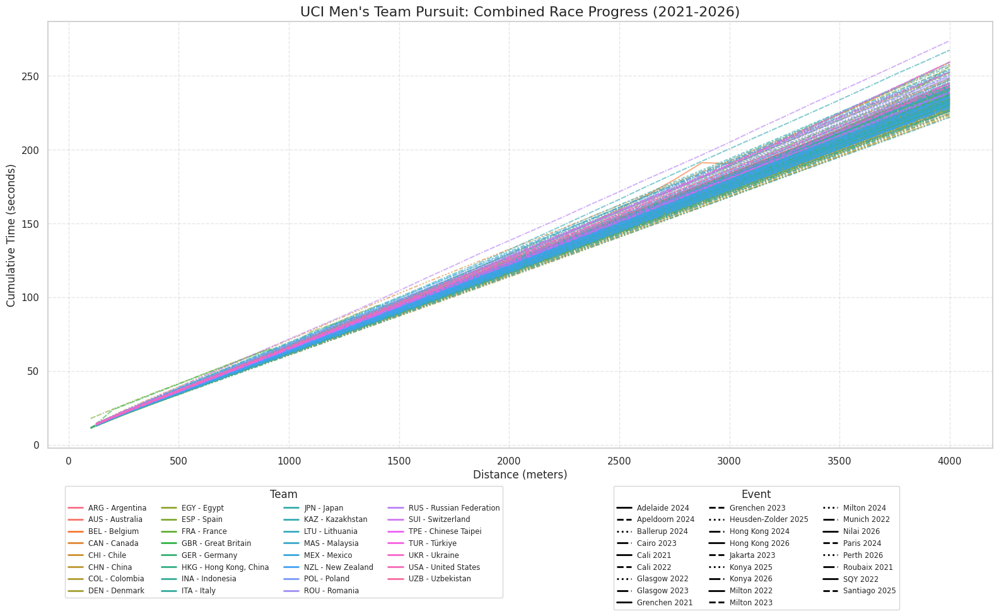

In [19]:
# Helper functions and data for the Combined Race Progress plot
def time_to_sec(t):
    if isinstance(t, str) and ':' in t: m, s = t.split(':'); return int(m)*60 + float(s)
    return float(t)

team_name_corrections = {
    'DEN - DENMARK': 'DEN - Denmark', 'FRA - FRANCE': 'FRA - France', 'GBR - GREAT BRITAIN': 'GBR - Great Britain',
    'GER - GERMANY': 'GER - Germany', 'ESP - SPAIN': 'ESP - Spain', 'BEL - BELGIUM': 'BEL - Belgium',
    'POL - POLAND': 'POL - Poland', 'SUI - SWITZERLAND': 'SUI - Switzerland', 'ITA - ITALY': 'ITA - Italy',
    'RCF - Russian Cycling Federation': 'RUS - Russian Federation', 'USA - United States Of America': 'USA - United States',
    "CHN - People's Republic Of China": 'CHN - China'
}

# Updated chronological event mapping with verified reference dates
event_order_data = [
    ('2021_Cali_Qualifying', '2021-09-09', 1), ('2021_Cali_First_Round', '2021-09-09', 2), ('2021_Cali_Finals', '2021-09-09', 3),
    ('2021_Grenchen_Qualifying', '2021-10-05', 1), ('2021_Grenchen_First_Round', '2021-10-06', 2), ('2021_Grenchen_Finals', '2021-10-06', 3),
    ('2021_Roubaix_Qualifying', '2021-10-20', 1), ('2021_Roubaix_First_Round', '2021-10-20', 2), ('2021_Roubaix_Finals', '2021-10-21', 3),
    ('2022_Glasgow_Qualifying', '2022-04-21', 1), ('2022_Glasgow_First_Round', '2022-04-21', 2), ('2022_Glasgow_Finals', '2022-04-21', 3),
    ('2022_Milton_Qualifying', '2022-05-12', 1), ('2022_Milton_First_Round', '2022-05-12', 2), ('2022_Milton_Finals', '2022-05-12', 3),
    ('2022_Cali_Qualifying', '2022-07-07', 1), ('2022_Cali_First_Round', '2022-07-07', 2), ('2022_Cali_Finals', '2022-07-07', 3),
    ('2022_Munich_Qualifying', '2022-08-11', 1), ('2022_Munich_First_Round', '2022-08-12', 2), ('2022_Munich_Finals', '2022-08-12', 3),
    ('2022_SQY_Qualifying', '2022-10-12', 1), ('2022_SQY_First_Round', '2022-10-13', 2), ('2022_SQY_Finals', '2022-10-13', 3),
    ('2023_Grenchen_Qualifying', '2023-02-08', 1), ('2023_Grenchen_First_Round', '2023-02-09', 2), ('2023_Grenchen_Finals', '2023-02-09', 3),
    ('2023_Jakarta_Qualifying', '2023-02-23', 1), ('2023_Jakarta_First_Round', '2023-02-24', 2), ('2023_Jakarta_Finals', '2023-02-24', 3),
    ('2023_Cairo_Qualifying', '2023-03-14', 1), ('2023_Cairo_First_Round', '2023-03-15', 2), ('2023_Cairo_Finals', '2023-03-15', 3),
    ('2023_Milton_Qualifying', '2023-04-20', 1), ('2023_Milton_First_Round', '2023-04-21', 2), ('2023_Milton_Finals', '2023-04-21', 3),
    ('2023_Glasgow_Qualifying', '2023-08-03', 1), ('2023_Glasgow_First_Round', '2023-08-04', 2), ('2023_Glasgow_Finals', '2023-08-05', 3),
    ('2024_Apeldoorn_Qualifying', '2024-01-10', 1), ('2024_Apeldoorn_First_Round', '2024-01-10', 2), ('2024_Apeldoorn_Finals', '2024-01-11', 3),
    ('2024_Adelaide_Qualifying', '2024-02-02', 1), ('2024_Adelaide_First_Round', '2024-02-02', 2), ('2024_Adelaide_Finals', '2024-02-02', 3),
    ('2024_Hong_Kong_Qualifying', '2024-03-15', 1), ('2024_Hong_Kong_First_Round', '2024-03-15', 2), ('2024_Hong_Kong_Finals', '2024-03-15', 3),
    ('2024_Milton_Qualifying', '2024-04-12', 1), ('2024_Milton_First_Round', '2024-04-12', 2), ('2024_Milton_Finals', '2024-04-12', 3),
    ('2024_Paris_Qualifying', '2024-08-05', 1), ('2024_Paris_First_Round', '2024-08-06', 2), ('2024_Paris_Finals', '2024-08-07', 3),
    ('2024_Ballerup_Qualifying', '2024-10-16', 1), ('2024_Ballerup_First_Round', '2024-10-16', 2), ('2024_Ballerup_Finals', '2024-10-17', 3),
    ('2025_Heusden_Qualifying', '2025-02-12', 1), ('2025_Heusden_First_Round', '2025-02-13', 2), ('2025_Heusden_Finals', '2025-02-13', 3),
    ('2025_Konya_Qualifying', '2025-03-14', 1), ('2025_Konya_First_Round', '2025-03-14', 2), ('2025_Konya_Finals', '2025-03-14', 3),
    ('2025_Santiago_Qualifying', '2025-10-22', 1), ('2025_Santiago_First_Round', '2025-10-22', 2), ('2025_Santiago_Finals', '2025-10-23', 3),
    ('2026_Konya_Qualifying', '2026-02-01', 1), ('2026_Konya_First_Round', '2026-02-02', 2), ('2026_Konya_Finals', '2026-02-02', 3),
    ('2026_Perth_Qualifying', '2026-03-06', 1), ('2026_Perth_First_Round', '2026-03-06', 2), ('2026_Perth_Finals', '2026-03-06', 3),
    ('2026_Hong_Kong_Qualifying', '2026-04-17', 1), ('2026_Hong_Kong_First_Round', '2026-04-17', 2), ('2026_Hong_Kong_Finals', '2026-04-17', 3),
    ('2026_Nilai_Qualifying', '2026-04-24', 1), ('2026_Nilai_First_Round', '2026-04-24', 2), ('2026_Nilai_Finals', '2026-04-24', 3)
]
event_order_df = pd.DataFrame(event_order_data, columns=['Event_Round', 'Date', 'Round_Sort'])
event_order_df['Date'] = pd.to_datetime(event_order_df['Date'])

# Refresh data and regenerate the Combined Race Progress plot
all_csv_files = glob.glob("cleaned_csv_data/*/*.csv")
list_of_dfs = []
for f in all_csv_files:
    df_temp = pd.read_csv(f)
    df_temp['Event_Round'] = os.path.basename(f).replace('.csv', '')
    list_of_dfs.append(df_temp)

viz_df = pd.concat(list_of_dfs, ignore_index=True)
viz_df['Time_Sec'] = viz_df['Time'].apply(time_to_sec)
viz_df['Dist_Num'] = viz_df['Distance'].str.extract(r'(\d+)').astype(int)
viz_df = viz_df.merge(event_order_df, on='Event_Round', how='left')
viz_df['Team'] = viz_df['Team'].replace(team_name_corrections).str.replace(r'(\s[AB12]$)', '', regex=True)

def get_event_label(er_name):
    parts = er_name.split('_')
    year = parts[0]
    venue = parts[1]
    if venue == 'Heusden': venue = 'Heusden-Zolder'
    elif venue == 'Hong': venue = 'Hong Kong'
    return f"{venue} {year}"

viz_df['Event'] = viz_df['Event_Round'].apply(get_event_label)
viz_df = viz_df.sort_values(['Date', 'Round_Sort', 'Team', 'Dist_Num'])

fig, ax = plt.subplots(figsize=(16, 10))
sns.lineplot(data=viz_df, x='Dist_Num', y='Time_Sec', hue='Team', style='Event', alpha=0.6, errorbar=None, ax=ax, legend=False)

plt.title("UCI Men's Team Pursuit: Combined Race Progress (2021-2026)", fontsize=16)
plt.xlabel('Distance (meters)')
plt.ylabel('Cumulative Time (seconds)')
plt.grid(True, linestyle='--', alpha=0.5)

unique_teams = sorted(viz_df['Team'].unique())
team_colors = sns.color_palette("husl", n_colors=len(unique_teams))
team_color_map = {team: team_colors[i] for i, team in enumerate(unique_teams)}
team_handles = [Line2D([0], [0], color=team_color_map[team], lw=2) for team in unique_teams]

unique_events = sorted(viz_df['Event'].unique())
linestyles_cycle = ['-', '--', ':', '-.']
event_handles = [Line2D([0], [0], color='black', linestyle=linestyles_cycle[i % len(linestyles_cycle)], lw=2) for i, eg in enumerate(unique_events)]

legend1 = ax.legend(team_handles, unique_teams, loc='upper center', bbox_to_anchor=(0.25, -0.08), ncol=4, fontsize='x-small', title='Team')
ax.add_artist(legend1)
legend2 = ax.legend(event_handles, unique_events, loc='upper center', bbox_to_anchor=(0.75, -0.08), ncol=3, fontsize='x-small', title='Event')

plt.tight_layout()
plt.show()

In [20]:
def determine_medals_bracket_logic(viz_df, manual_overrides=None):
    if manual_overrides is None:
        manual_overrides = {}

    def standardize_team_name(row):
        name = str(row['Team'])
        corrections = {
            'DEN - DENMARK': 'DEN - Denmark', 'FRA - FRANCE': 'FRA - France',
            'GBR - GREAT BRITAIN': 'GBR - Great Britain', 'GER - GERMANY': 'GER - Germany',
            'ESP - SPAIN': 'ESP - Spain', 'BEL - BELGIUM': 'BEL - Belgium',
            'POL - POLAND': 'POL - Poland', 'SUI - SWITZERLAND': 'SUI - Switzerland',
            'ITA - ITALY': 'ITA - Italy', "CHN - People's Republic Of China": 'CHN - China'
        }
        for k, v in corrections.items():
            if k in name.upper():
                suffix = re.search(r'(\s[AB12]$)', name)
                return v + (suffix.group(1) if suffix else "")
        if 'COL' in name and 'Cali 2022' in row['Event']: return name.strip()
        return name.strip()

    df = viz_df.copy()
    df['Team'] = df.apply(standardize_team_name, axis=1)
    finals = df[df['Event_Round'].str.contains('Finals')].copy()
    medal_results = []

    for event in finals['Event_Round'].unique():
        ev_df = finals[finals['Event_Round'] == event]
        for heat in ev_df['Heat_Type'].unique():
            if heat == "Unknown": continue
            heat_df = ev_df[ev_df['Heat_Type'] == heat]
            # Determine winner by max distance reached then minimum time
            summary = heat_df.groupby('Team').agg({'Time_Sec': 'max', 'Dist_Num': 'max'}).reset_index()
            summary = summary.sort_values(['Dist_Num', 'Time_Sec'], ascending=[False, True])

            for i, (idx, row_summary) in enumerate(summary.iterrows()):
                rank = 99
                medal = 'No Medal'
                if heat == "Gold/Silver": medal, rank = ('Gold', 1) if i == 0 else ('Silver', 2)
                elif heat == "Bronze": medal, rank = ('Bronze', 3) if i == 0 else ('4th', 4)
                elif heat == "5-6 Placement": rank = 5 if i == 0 else 6
                elif heat == "7-8 Placement": medal, rank = ('7th', 7) if i == 0 else ('8th', 8)
                medal_results.append({'Team': row_summary['Team'], 'Event': ev_df['Event'].iloc[0], 'Medal': medal, 'Bracket_Rank': rank, 'Event_Round': event})

    res_df = pd.DataFrame(medal_results)

    # Apply manual overrides
    for override_event, overrides in manual_overrides.items():
        for team_to_medal, medal_type in overrides.items():
            # Find the row for the team that should get the medal
            # Update their medal and rank
            idx_team = res_df[(res_df['Event'] == override_event) & (res_df['Team'] == team_to_medal)].index
            if not idx_team.empty:
                res_df.loc[idx_team, 'Medal'] = medal_type
                res_df.loc[idx_team, 'Bracket_Rank'] = {'Gold': 1, 'Silver': 2, 'Bronze': 3, '4th': 4, '7th': 7}.get(medal_type, 99) # Assign rank based on medal type

            # Find the team that previously held this medal and demote them
            # This is a simplified demotion, assuming a direct swap or demotion to 4th/no medal
            if medal_type == 'Bronze': # Specific logic for bronze override
                # Find the team that currently has Bronze for this event and is not the `team_to_medal`
                idx_current_bronze = res_df[
                    (res_df['Event'] == override_event) &
                    (res_df['Medal'] == 'Bronze') &
                    (res_df['Team'] != team_to_medal)
                ].index
                if not idx_current_bronze.empty:
                    res_df.loc[idx_current_bronze, 'Medal'] = '4th' # Demote to 4th
                    res_df.loc[idx_current_bronze, 'Bracket_Rank'] = 4
            elif medal_type == 'Gold':
                idx_current_gold = res_df[
                    (res_df['Event'] == override_event) &
                    (res_df['Medal'] == 'Gold') &
                    (res_df['Team'] != team_to_medal)
                ].index
                if not idx_current_gold.empty:
                    res_df.loc[idx_current_gold, 'Medal'] = 'Silver'
                    res_df.loc[idx_current_gold, 'Bracket_Rank'] = 2
            elif medal_type == 'Silver':
                idx_current_silver = res_df[
                    (res_df['Event'] == override_event) &
                    (res_df['Medal'] == 'Silver') &
                    (res_df['Team'] != team_to_medal)
                ].index
                if not idx_current_silver.empty:
                    res_df.loc[idx_current_silver, 'Medal'] = 'Bronze'
                    res_df.loc[idx_current_silver, 'Bracket_Rank'] = 3

    # Ensure ranks are consistent after overrides (e.g., if a 4th place becomes Bronze, adjust other ranks)
    res_df = res_df.sort_values(by=['Event', 'Bracket_Rank']).reset_index(drop=True)

    return res_df

# Refresh data
all_csv_files = glob.glob("cleaned_csv_data/*/*.csv")
list_of_dfs = [pd.read_csv(f).assign(Event_Round=os.path.basename(f).replace('.csv','')) for f in all_csv_files]
viz_df = pd.concat(list_of_dfs, ignore_index=True)
viz_df['Time_Sec'] = viz_df['Time'].apply(time_to_sec)
viz_df['Dist_Num'] = viz_df['Distance'].str.extract(r'(\d+)').astype(int)
viz_df['Event'] = viz_df['Event_Round'].apply(lambda x: ' '.join(x.split('_')[1:2]) + ' ' + x.split('_')[0])

# Define manual overrides for Konya 2026
manual_medal_overrides = {
    'Konya 2026': {
        'GBR - Great Britain': 'Bronze',
        'FRA - France': '4th' # Demote France if they were previously Bronze
    }
}

medals_mapping = determine_medals_bracket_logic(viz_df, manual_medal_overrides)
# Verification display for Konya 2025 (unchanged) and Konya 2026 (overridden)
display(medals_mapping[medals_mapping['Event'].str.contains('Konya 2025')].sort_values('Bracket_Rank'))
display(medals_mapping[medals_mapping['Event'].str.contains('Konya 2026')].sort_values('Bracket_Rank'))

,Team,Event,Medal,Bracket_Rank,Event_Round
56,AUS - Australia,Konya 2025,Gold,1,2025_Konya_Finals
57,USA - United States,Konya 2025,Silver,2,2025_Konya_Finals
58,NZL - New Zealand,Konya 2025,Bronze,3,2025_Konya_Finals
59,FRA - France,Konya 2025,4th,4,2025_Konya_Finals


,Team,Event,Medal,Bracket_Rank,Event_Round
60,DEN - Denmark,Konya 2026,Gold,1,2026_Konya_Finals
61,SUI - Switzerland,Konya 2026,Silver,2,2026_Konya_Finals
62,GBR - Great Britain,Konya 2026,Bronze,3,2026_Konya_Finals
63,FRA - France,Konya 2026,4th,4,2026_Konya_Finals


In [21]:
def calculate_full_event_rankings(viz_df, medals_mapping):
    all_rankings = []
    unique_events = viz_df['Event'].unique()

    for event in unique_events:
        # 1. Get teams that reached the Finals
        event_medals = medals_mapping[medals_mapping['Event'] == event]
        finalist_teams = event_medals['Team'].tolist()
        finalist_ranks = event_medals.set_index('Team')['Bracket_Rank'].to_dict()

        # 2. Identify teams that reached the First Round
        first_round_id = viz_df[(viz_df['Event'] == event) & (viz_df['Event_Round'].str.contains('First_Round'))]['Event_Round'].unique()
        teams_in_r1 = []
        if len(first_round_id) > 0:
            r1_df = viz_df[viz_df['Event_Round'] == first_round_id[0]]
            teams_in_r1 = r1_df['Team'].unique().tolist()

        # 3. Identify all teams in Qualifying
        qual_id = viz_df[(viz_df['Event'] == event) & (viz_df['Event_Round'].str.contains('Qualifying'))]['Event_Round'].unique()
        all_teams = []
        if len(qual_id) > 0:
            qual_df = viz_df[viz_df['Event_Round'] == qual_id[0]]
            all_teams = qual_df['Team'].unique().tolist()

        # --- Logic Part A: Teams eliminated in Qualifying ---
        qual_eliminated = [t for t in all_teams if t not in teams_in_r1]
        qual_times = []
        if qual_eliminated and len(qual_id) > 0:
            q_data = viz_df[(viz_df['Event_Round'] == qual_id[0]) & (viz_df['Team'].isin(qual_eliminated))]
            q_finish = q_data.groupby('Team').agg({'Time_Sec': 'max', 'Dist_Num': 'max'}).reset_index()
            q_finish = q_finish.sort_values(['Dist_Num', 'Time_Sec'], ascending=[False, True])
            qual_times = q_finish['Team'].tolist()

        # --- Logic Part B: Teams eliminated in First Round ---
        r1_eliminated = [t for t in teams_in_r1 if t not in finalist_teams]
        r1_times = []
        if r1_eliminated and len(first_round_id) > 0:
            r1_data = viz_df[(viz_df['Event_Round'] == first_round_id[0]) & (viz_df['Team'].isin(r1_eliminated))]
            r1_finish = r1_data.groupby('Team').agg({'Time_Sec': 'max', 'Dist_Num': 'max'}).reset_index()
            r1_finish = r1_finish.sort_values(['Dist_Num', 'Time_Sec'], ascending=[False, True])
            r1_times = r1_finish['Team'].tolist()

        # --- Combine into Final Ranking List ---
        for t, r in finalist_ranks.items():
            all_rankings.append({'Event': event, 'Team': t, 'Final_Rank': r, 'Status': 'Finalist'})

        start_rank_r1 = len(finalist_teams) + 1
        for i, t in enumerate(r1_times):
            all_rankings.append({'Event': event, 'Team': t, 'Final_Rank': start_rank_r1 + i, 'Status': 'Eliminated R1'})

        start_rank_q = len(finalist_teams) + len(r1_times) + 1
        for i, t in enumerate(qual_times):
            all_rankings.append({'Event': event, 'Team': t, 'Final_Rank': start_rank_q + i, 'Status': 'Eliminated Qual'})

    return pd.DataFrame(all_rankings)

full_event_rankings = calculate_full_event_rankings(viz_df, medals_mapping)
# Specifically display Milton 2023 to verify Canada A and B separation
display(full_event_rankings[full_event_rankings['Event'] == 'Milton 2023'].sort_values('Final_Rank'))

,Event,Team,Final_Rank,Status
255,Milton 2023,GBR - Great Britain,1,Finalist
256,Milton 2023,ITA - Italy,2,Finalist
257,Milton 2023,FRA - France,3,Finalist
258,Milton 2023,AUS - Australia,4,Finalist
259,Milton 2023,CAN - Canada A,5,Eliminated R1
260,Milton 2023,BEL - Belgium,6,Eliminated R1
261,Milton 2023,CHN - China,7,Eliminated R1
262,Milton 2023,GER - Germany,8,Eliminated R1
263,Milton 2023,JPN - Japan,9,Eliminated Qual
264,Milton 2023,SUI - Switzerland,10,Eliminated Qual


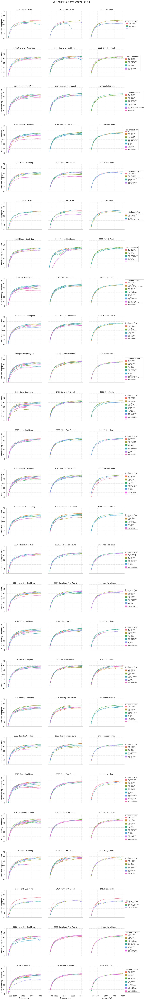

In [22]:
# Prepare Data
pacing_analysis_df = viz_df.copy()
pacing_analysis_df['Cumulative_Avg_Speed_KMH'] = (pacing_analysis_df['Dist_Num'] / 1000) / (pacing_analysis_df['Time_Sec'].replace(0, np.nan) / 3600)

# Sort events chronologically
chronological_order = event_order_df.sort_values(['Date', 'Round_Sort'])['Event_Round'].tolist()
chronological_order = [e for e in chronological_order if e in pacing_analysis_df['Event_Round'].unique()]

pacing_analysis_df['Event_Round'] = pd.Categorical(pacing_analysis_df['Event_Round'], categories=chronological_order, ordered=True)

# Sort by event, team, AND distance to prevent points connecting out of order
plot_df = pacing_analysis_df[pacing_analysis_df['Dist_Num'] > 125].sort_values(['Event_Round', 'Team', 'Dist_Num']).copy()

# Setup FacetGrid
cols_per_row = 3
g = sns.FacetGrid(plot_df, col="Event_Round", col_order=chronological_order, col_wrap=cols_per_row, height=4, aspect=1.2, sharey=True)

axes = g.axes.flat
event_rounds = g.col_names

# Pre-calculate row palettes to ensure color consistency within each row
row_color_maps = {}

for i, ax in enumerate(axes):
    if i >= len(event_rounds): continue
    event_id = event_rounds[i]
    row_idx = i // cols_per_row

    if row_idx not in row_color_maps:
        row_events = event_rounds[row_idx*cols_per_row : (row_idx+1)*cols_per_row]
        row_qual_teams = set()
        for re_name in row_events:
            base_name = "_".join(re_name.split("_")[:2])
            qual_name = f"{base_name}_Qualifying"
            teams = viz_df[viz_df['Event_Round'] == qual_name]['Team'].unique()
            row_qual_teams.update(teams)

        # Fallback if no specific qualifying found
        if not row_qual_teams:
            row_qual_teams = set(plot_df[plot_df['Event_Round'].isin(row_events)]['Team'].unique())

        sorted_teams = sorted(list(row_qual_teams))
        palette = sns.color_palette("husl", len(sorted_teams))
        row_color_maps[row_idx] = {team: palette[j] for j, team in enumerate(sorted_teams)}

    color_map = row_color_maps[row_idx]
    event_data = plot_df[plot_df['Event_Round'] == event_id]

    # Use lineplot with hue and palette for robust grouping and color application
    sns.lineplot(data=event_data, x="Dist_Num", y="Cumulative_Avg_Speed_KMH", hue="Team",
                 ax=ax, palette=color_map, marker='o', markersize=4, alpha=0.8, legend=False)

    # Formatting
    ax.set_title(event_id.replace('_', ' '))
    ax.set_xticks([500, 1000, 2000, 3000, 4000])
    ax.set_ylim(40, 70)
    ax.grid(True, linestyle='--', alpha=0.6)

    # One legend per row
    if (i + 1) % cols_per_row == 0 or (i == len(event_rounds) - 1):
        patches = [mpatches.Patch(color=c, label=t) for t, c in color_map.items()]
        ax.legend(handles=patches, title="Nations in Row", loc='center left', bbox_to_anchor=(1, 0.5), fontsize='7', ncol=1, frameon=True)

g.set_axis_labels("Distance (m)", "Cumulative Avg Speed (km/h)")
plt.subplots_adjust(top=0.97, right=0.88, hspace=0.4)
g.fig.suptitle("Chronological Comparative Pacing", fontsize=16)
plt.show()

Master CSV exported with 18870 rows.


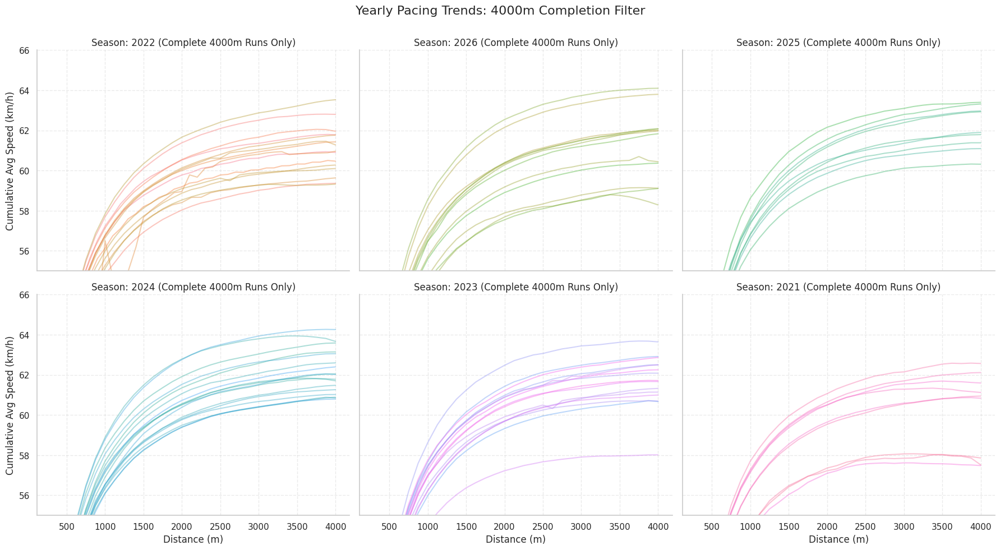

In [23]:
# 1. Export Master CSV with standardised columns
final_export_df = viz_df.copy()
# Ensure the requested columns are present
final_export_df['Year'] = final_export_df['Event_Round'].str[:4]

# Reordering columns for readability
cols = ['Year', 'Event', 'Event_Round', 'Date', 'Team', 'Distance', 'Dist_Num', 'Time', 'Time_Sec', 'Rank_Raw']
final_export_df = final_export_df[[c for c in cols if c in final_export_df.columns]]

final_export_df.to_csv('UCI_Track_Cycling_Master_2021_2026.csv', index=False)
print(f"Master CSV exported with {len(final_export_df)} rows.")

# 2. Refined Pacing Plot: Grouped by Year
final_export_df['Avg_Speed_KMH'] = (final_export_df['Dist_Num'] / 1000) / (final_export_df['Time_Sec'].replace(0, pd.NA) / 3600)
plot_data = final_export_df[final_export_df['Dist_Num'] > 250].copy()

# 3. Identify runs that reached the full 4000m distance
complete_runs = final_export_df[final_export_df['Dist_Num'] == 4000][['Event_Round', 'Team']].drop_duplicates()

# 4. Filter the main dataset to only include these specific runs
complete_plot_data = final_export_df.merge(complete_runs, on=['Event_Round', 'Team'], how='inner')

# 5. Filter for distance > 250m to avoid start noise
complete_plot_data = complete_plot_data[complete_plot_data['Dist_Num'] > 250].copy()

# 6. Generate the Refined Pacing Plot
g = sns.FacetGrid(complete_plot_data, col='Year', hue='Event_Round', col_wrap=3, height=5, aspect=1.2)
g.map(sns.lineplot, "Dist_Num", "Avg_Speed_KMH", alpha=0.4, errorbar=None)

g.set_axis_labels('Distance (m)', 'Cumulative Avg Speed (km/h)')
g.set_titles('Season: {col_name} (Complete 4000m Runs Only)')

for ax in g.axes.flat:
    ax.set_ylim(55, 66)
    ax.grid(True, linestyle='--', alpha=0.4)

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Yearly Pacing Trends: 4000m Completion Filter', fontsize=16)
plt.show()

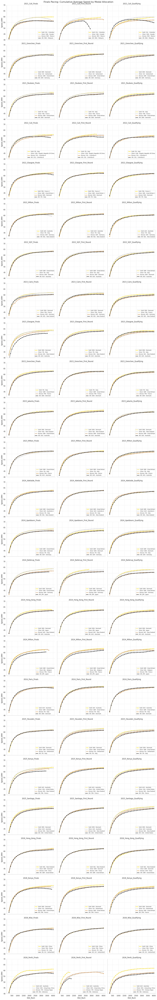

In [24]:
# Re-generate the Finals Pacing plot with medal labels
rank_colors = {i: color for i, color in enumerate(['#FFD700', '#C0C0C0', '#CD7F32', '#000000'], 1)}
labels_map = {1: 'Gold: ', 2: 'Silver: ', 3: 'Bronze: ', 4: '4th: '}

plot_ranks = medals_mapping[medals_mapping['Bracket_Rank'] <= 4].copy()
plot_finalists = viz_df.merge(
    plot_ranks[['Team', 'Event', 'Medal', 'Bracket_Rank']],
    on=['Team', 'Event'],
    how='inner'
)

plot_finalists['Speed_KMH'] = (plot_finalists['Dist_Num'] / 1000) / (plot_finalists['Time_Sec'].replace(0, np.nan) / 3600)
plot_finalists = plot_finalists.sort_values(['Event_Round', 'Bracket_Rank', 'Dist_Num'])
plot_finalists_filtered = plot_finalists[plot_finalists['Dist_Num'] > 125]

g = sns.FacetGrid(plot_finalists_filtered, col='Event_Round', hue='Bracket_Rank', palette=rank_colors, col_wrap=3, height=4, aspect=1.3)
g.map(sns.lineplot, 'Dist_Num', 'Speed_KMH', marker='o', alpha=0.8)
g.set_titles('{col_name}')

for ax, title in zip(g.axes.flat, g.col_names):
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_ylim(40, 70)
    subset = plot_finalists[plot_finalists['Event_Round'] == title][['Team', 'Bracket_Rank', 'Medal']].drop_duplicates().sort_values('Bracket_Rank')
    handles = [Line2D([0], [0], color=rank_colors.get(int(row['Bracket_Rank']), '#999'), lw=2, label=f"{labels_map.get(int(row['Bracket_Rank']), '')}{row['Team']}") for _, row in subset.iterrows()]
    if handles: ax.legend(handles=handles, loc='lower right', fontsize='x-small', frameon=True)

g.fig.tight_layout(rect=[0, 0, 1, 0.98])
g.fig.suptitle('Finals Pacing: Cumulative Average Speed by Medal Allocation', fontsize=16)
plt.show()

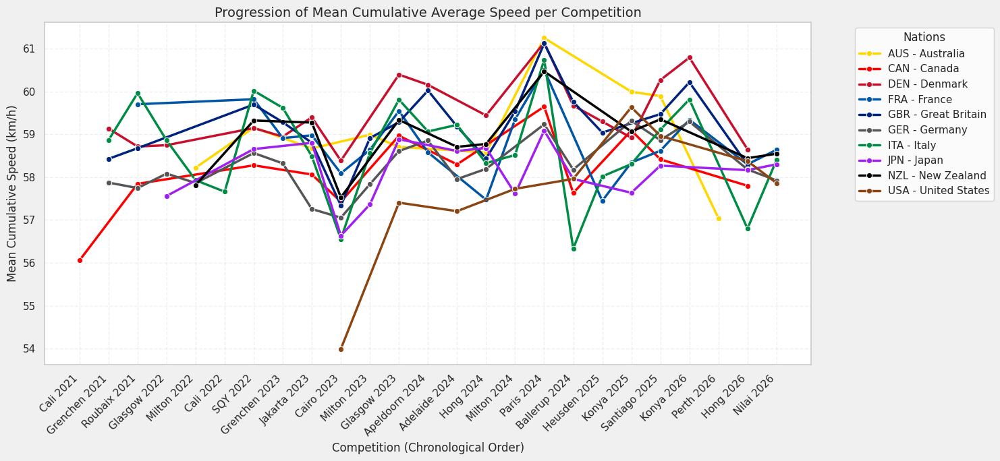

In [25]:
# Define the custom color mapping
TEAM_COLORS_HEX = {
    "GBR - Great Britain": "#00247D",
    "DEN - Denmark":       "#C8102E",
    "AUS - Australia":     "#FFD700",
    "ITA - Italy":         "#008C45",
    "FRA - France":        "#0055A4",
    "NZL - New Zealand":   "#000000",
    "GER - Germany":       "#555555",
    "CAN - Canada":        "#FF0000",
    "USA - United States": "#8B4513",
    "JPN - Japan":         "#A020F0",
}

target_nations = sorted(list(TEAM_COLORS_HEX.keys()))

# 1. Prepare data
prog_df = final_export_df[final_export_df['Team'].isin(target_nations)].copy()
# Calculate Cumulative Average Speed (km/h) for every split recorded
prog_df['Cum_Avg_Speed_KMH'] = (prog_df['Dist_Num'] / 1000) / (prog_df['Time_Sec'] / 3600)

# 2. Re-attach Date info for chronological sorting
if 'Date' not in prog_df.columns:
    prog_df = prog_df.merge(event_order_df[['Event_Round', 'Date']], on='Event_Round', how='left')

# 3. Aggregation Logic:
# First, we calculate the 'Race Average Speed' for every single run (mean of its splits)
# Filter to >250m to avoid the start influencing the average
race_averages = prog_df[prog_df['Dist_Num'] >= 250].groupby(['Date', 'Event', 'Event_Round', 'Team'])['Cum_Avg_Speed_KMH'].mean().reset_index()

# Second, average those race results per competition
competition_metric = race_averages.groupby(['Date', 'Event', 'Team'])['Cum_Avg_Speed_KMH'].mean().reset_index()
competition_metric = competition_metric.sort_values('Date')

# 4. Plotting
plt.figure(figsize=(15, 7), facecolor='#f0f0f0')
sns.lineplot(data=competition_metric, x='Event', y='Cum_Avg_Speed_KMH', hue='Team',
             hue_order=target_nations, marker='o', palette=TEAM_COLORS_HEX, linewidth=2.5, errorbar=None)

plt.title('Progression of Mean Cumulative Average Speed per Competition', fontsize=14)
plt.ylabel('Mean Cumulative Speed (km/h)')
plt.xlabel('Competition (Chronological Order)')
plt.grid(True, alpha=0.3, linestyle='--')
plt.xticks(rotation=45, ha='right')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Nations")

plt.tight_layout()
plt.show()

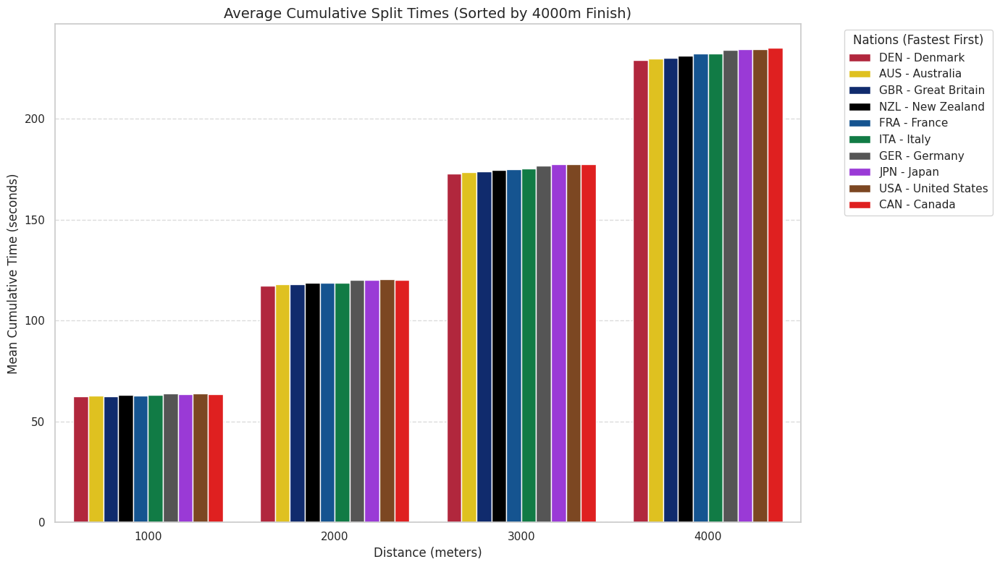

Nations sorted by shortest average 4000m finishing time:


Dist_Num,1000,2000,3000,4000
Team,,,,
DEN - Denmark,62.363,117.234,172.883,228.876
AUS - Australia,62.677,117.832,173.558,229.675
GBR - Great Britain,62.584,118.064,173.944,230.186
NZL - New Zealand,63.157,118.533,174.665,231.105
FRA - France,62.820,118.596,174.740,232.081
ITA - Italy,62.964,118.793,175.095,232.093
GER - Germany,63.813,120.082,176.759,233.940
JPN - Japan,63.579,119.989,177.329,234.298
USA - United States,63.847,120.391,177.354,234.551


In [26]:
# 1. Define target split points and nations
split_points = [1000, 2000, 3000, 4000]
target_nations = [
    "GBR - Great Britain", "DEN - Denmark", "AUS - Australia",
    "ITA - Italy", "FRA - France", "NZL - New Zealand",
    "GER - Germany", "CAN - Canada", "USA - United States", "JPN - Japan"
]

# 2. Filter data
# We ensure we only take rows where a time was recorded for that split
filtered_splits = final_export_df[
    (final_export_df['Team'].isin(target_nations)) &
    (final_export_df['Dist_Num'].isin(split_points)) &
    (final_export_df['Time_Sec'] > 0)
].copy()

# 3. Calculate mean split times
split_comparison = filtered_splits.groupby(['Team', 'Dist_Num'])['Time_Sec'].mean().reset_index()
split_pivot = split_comparison.pivot(index='Team', columns='Dist_Num', values='Time_Sec')
split_pivot_sorted = split_pivot.sort_values(by=4000).round(3)

# 4. Visualisation using sorted order
plt.figure(figsize=(14, 8))
sns.barplot(data=split_comparison, x='Dist_Num', y='Time_Sec', hue='Team',
            hue_order=split_pivot_sorted.index.tolist(), palette=TEAM_COLORS_HEX)

plt.title('Average Cumulative Split Times (Sorted by 4000m Finish)', fontsize=14)
plt.xlabel('Distance (meters)', fontsize=12)
plt.ylabel('Mean Cumulative Time (seconds)', fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Nations (Fastest First)")
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

print("Nations sorted by shortest average 4000m finishing time:")
display(split_pivot_sorted)

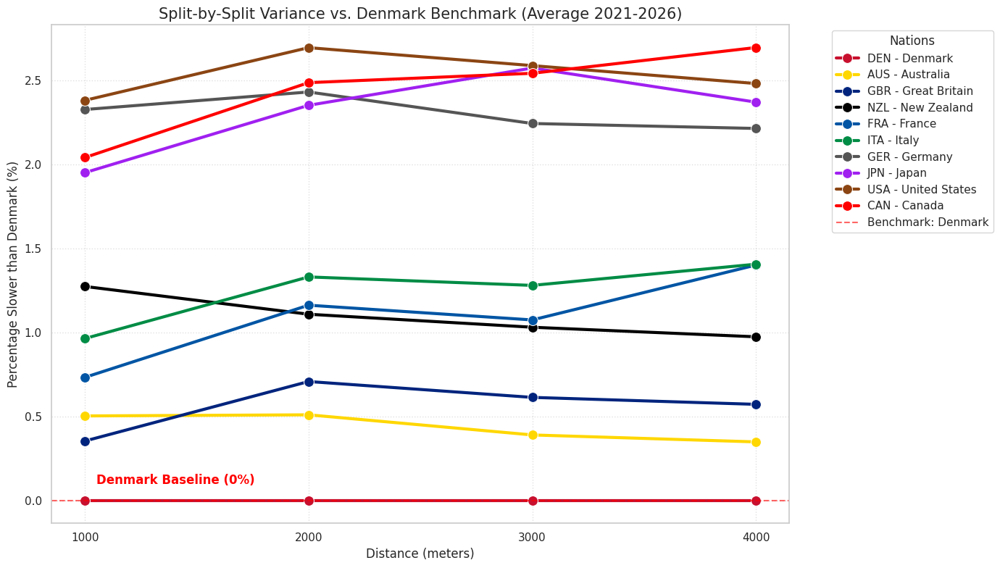

Percentage variance from Denmark benchmark (0.0 = Equal to DEN):


Dist_Num,1000,2000,3000,4000
Team,,,,
DEN - Denmark,0.000,0.000,0.000,0.000
AUS - Australia,0.504,0.510,0.390,0.349
GBR - Great Britain,0.354,0.708,0.614,0.572
NZL - New Zealand,1.273,1.108,1.031,0.974
FRA - France,0.733,1.162,1.074,1.400
ITA - Italy,0.964,1.330,1.279,1.406
GER - Germany,2.325,2.429,2.242,2.213
JPN - Japan,1.950,2.350,2.572,2.369
USA - United States,2.380,2.693,2.586,2.480


In [27]:
# 1. Prepare benchmark data (Denmark)
denmark_benchmark = split_pivot_sorted.loc['DEN - Denmark']

# 2. Calculate percentage difference for all target nations relative to Denmark
# Formula: ((Team_Time - Den_Time) / Den_Time) * 100
split_variance = split_pivot_sorted.apply(lambda x: ((x - denmark_benchmark) / denmark_benchmark) * 100, axis=1)

# 3. Reshape for plotting
variance_melted = split_variance.reset_index().melt(id_vars='Team', var_name='Split', value_name='Pct_From_Benchmark')

# 4. Visualisation
plt.figure(figsize=(14, 8))
sns.lineplot(data=variance_melted, x='Split', y='Pct_From_Benchmark', hue='Team',
             palette=TEAM_COLORS_HEX, marker='o', linewidth=3, markersize=10)

# Add a horizontal line at 0 (The Denmark Baseline)
plt.axhline(0, color='red', linestyle='--', alpha=0.6, label='Benchmark: Denmark')

plt.title('Split-by-Split Variance vs. Denmark Benchmark (Average 2021-2026)', fontsize=15)
plt.xlabel('Distance (meters)', fontsize=12)
plt.ylabel('Percentage Slower than Denmark (%)', fontsize=12)
plt.xticks([1000, 2000, 3000, 4000])
plt.grid(True, linestyle=':', alpha=0.6)

# Annotate the plot to help interpretation
plt.text(1050, 0.1, 'Denmark Baseline (0%)', color='red', fontweight='bold')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Nations")
plt.tight_layout()
plt.show()

# Display the table for precision
print("Percentage variance from Denmark benchmark (0.0 = Equal to DEN):")
display(split_variance.round(3))

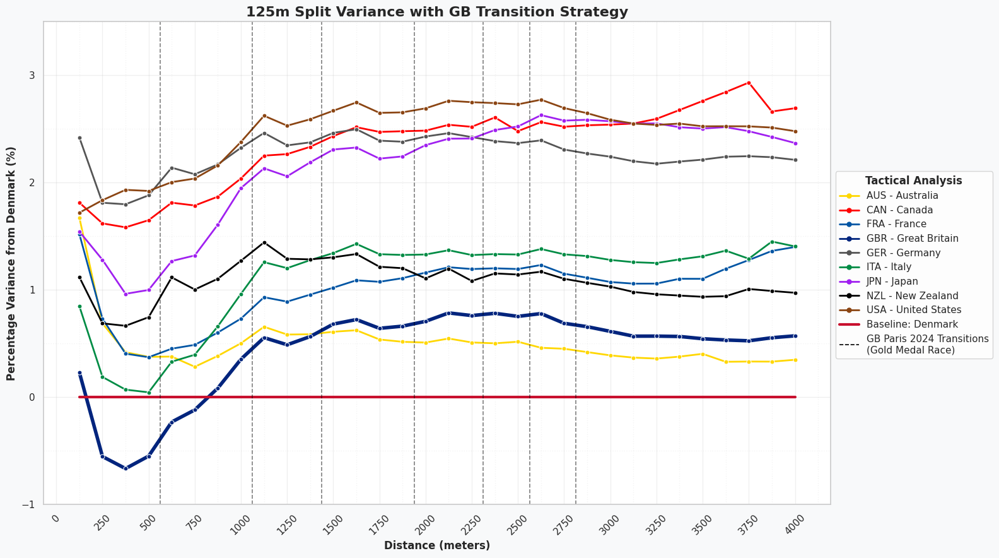

Percentage Variance Table for 125m Splits


Dist_Num,125,250,375,500,625,750,875,1000,1125,1250,...,2875,3000,3125,3250,3375,3500,3625,3750,3875,4000
Team,,,,,,,,,,,,,,,,,,,,,
AUS - Australia,1.675,0.689,0.419,0.376,0.379,0.284,0.386,0.503,0.657,0.584,...,0.421,0.390,0.370,0.360,0.379,0.405,0.330,0.333,0.332,0.349
CAN - Canada,1.813,1.620,1.583,1.650,1.813,1.787,1.870,2.039,2.252,2.266,...,2.534,2.541,2.551,2.594,2.677,2.761,2.844,2.932,2.663,2.694
DEN - Denmark,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
FRA - France,1.520,0.732,0.406,0.373,0.453,0.488,0.603,0.733,0.932,0.891,...,1.113,1.074,1.059,1.059,1.104,1.104,1.197,1.278,1.364,1.400
GBR - Great Britain,0.231,-0.552,-0.665,-0.549,-0.231,-0.118,0.086,0.355,0.556,0.489,...,0.657,0.614,0.569,0.570,0.566,0.545,0.534,0.526,0.555,0.572
GER - Germany,2.420,1.812,1.798,1.882,2.140,2.078,2.170,2.325,2.463,2.347,...,2.271,2.242,2.200,2.176,2.196,2.214,2.242,2.246,2.237,2.212
ITA - Italy,0.848,0.189,0.071,0.046,0.331,0.396,0.662,0.963,1.259,1.203,...,1.315,1.280,1.259,1.251,1.285,1.314,1.366,1.291,1.451,1.406
JPN - Japan,1.544,1.281,0.964,1.000,1.269,1.321,1.610,1.950,2.133,2.059,...,2.586,2.572,2.551,2.552,2.516,2.504,2.517,2.479,2.426,2.369
NZL - New Zealand,1.119,0.689,0.666,0.746,1.117,1.004,1.105,1.272,1.443,1.290,...,1.066,1.031,0.981,0.960,0.948,0.936,0.942,1.009,0.990,0.974


In [28]:
# Define base intervals and specific GBR tactical markers
base_intervals = list(range(125, 4125, 125))
gb_paris_transitions = [562.5, 1062.5, 1437.5, 1937.5, 2312.5, 2562.5, 2812.5]

# Filter and calculate mean split times for base intervals
filtered_splits_125 = final_export_df[
    (final_export_df['Team'].isin(target_nations)) &
    (final_export_df['Dist_Num'].isin(base_intervals)) &
    (final_export_df['Time_Sec'] > 0)
].copy()

split_comparison_125 = filtered_splits_125.groupby(['Team', 'Dist_Num'])['Time_Sec'].mean().reset_index()
split_pivot_125 = split_comparison_125.pivot(index='Team', columns='Dist_Num', values='Time_Sec')

# Calculate Percentage Variance vs. Denmark Benchmark
denmark_label = 'DEN - Denmark'
if denmark_label in split_pivot_125.index:
    denmark_benchmark_125 = split_pivot_125.loc[denmark_label]
    split_variance_125 = split_pivot_125.apply(lambda x: ((x - denmark_benchmark_125) / denmark_benchmark_125) * 100, axis=1)

    # Melt for the line plot
    variance_melted_125 = split_variance_125.reset_index().melt(id_vars='Team', var_name='Split', value_name='Pct_From_Benchmark')

    # Visualisation
    plt.figure(figsize=(16, 9), facecolor='#f8f9fa')
    ax = plt.gca()

    gbr_label = 'GBR - Great Britain'

    # Plot nations other than GBR and Denmark with default style
    nations_for_default_plot = [n for n in target_nations if n != denmark_label and n != gbr_label]
    other_nations_data_filtered = variance_melted_125[variance_melted_125['Team'].isin(nations_for_default_plot)]

    sns.lineplot(data=other_nations_data_filtered, x='Split', y='Pct_From_Benchmark', hue='Team',
                 hue_order=sorted(nations_for_default_plot), # Ensure hue_order is based on these filtered nations
                 palette=TEAM_COLORS_HEX, marker='o', linewidth=2, markersize=5, ax=ax, legend=False)

    # Plot GBR separately to make its line thicker, but markersize same
    gbr_data = variance_melted_125[variance_melted_125['Team'] == gbr_label]
    sns.lineplot(data=gbr_data, x='Split', y='Pct_From_Benchmark', color=TEAM_COLORS_HEX[gbr_label],
                 marker='o', linewidth=4, markersize=5, ax=ax, legend=False)

    # Plot Denmark separately without markers to serve as the baseline trend
    den_data = variance_melted_125[variance_melted_125['Team'] == denmark_label]
    sns.lineplot(data=den_data, x='Split', y='Pct_From_Benchmark', color='#C8102E',
                 linewidth=3, label='Baseline: Denmark', ax=ax, legend=False)

    # Collect handles and labels for custom legend
    all_handles, all_labels = [], []

    # Generate handles for the 'hue' teams based on sorted_other_nations
    sorted_other_nations_for_legend = sorted([n for n in target_nations if n != denmark_label])
    hue_handles = [Line2D([0], [0], color=TEAM_COLORS_HEX[team_name], lw=2, marker='o', markersize=5) for team_name in sorted_other_nations_for_legend]
    hue_labels = sorted_other_nations_for_legend

    # Handle the 'Baseline: Denmark' manually
    denmark_handle = Line2D([0], [0], color='#C8102E', lw=3)
    denmark_label_str = 'Baseline: Denmark'

    # Combine the team and Denmark baseline handles/labels for the first part of the legend
    combined_handles = hue_handles + [denmark_handle]
    combined_labels = hue_labels + [denmark_label_str]

    # Add vertical lines and their labels
    vertical_line_handles = []
    vertical_line_labels = []
    for i, dist in enumerate(gb_paris_transitions):
        label_text = 'GB Paris 2024 Transitions\n(Gold Medal Race)' if i == 0 else ""
        ax.axvline(x=dist, color='black', linestyle='--', alpha=0.5, linewidth=1.2) # Plot the line, no label here
        if label_text: # Only add to legend if there's a label
            # Create a separate Line2D handle for the vertical line for the legend
            vertical_line_handles.append(Line2D([0], [0], color='black', linestyle='--', linewidth=1.2))
            vertical_line_labels.append(label_text)

    # Combine all handles and labels for the final legend, in the desired order
    final_handles = combined_handles + vertical_line_handles
    final_labels = combined_labels + vertical_line_labels

    ax.xaxis.set_major_locator(mticker.MultipleLocator(250))
    ax.xaxis.set_minor_locator(mticker.MultipleLocator(125))
    ax.yaxis.set_major_locator(mticker.MultipleLocator(1.0))
    ax.yaxis.set_minor_locator(mticker.MultipleLocator(0.5))

    plt.title('125m Split Variance with GB Transition Strategy', fontsize=16, fontweight='bold')
    plt.xlabel('Distance (meters)', fontsize=12, fontweight='bold')
    plt.ylabel('Percentage Variance from Denmark (%)', fontsize=12, fontweight='bold')
    plt.grid(which='major', linestyle='-', alpha=0.3)
    plt.grid(which='minor', linestyle=':', alpha=0.2)
    plt.ylim(-1, 3.5)
    plt.xticks(rotation=45)
    legend = plt.legend(final_handles, final_labels, bbox_to_anchor=(1.0, 0.7), loc='upper left', title="Tactical Analysis")
    legend.get_title().set_fontweight('bold')
    plt.tight_layout()
    plt.savefig('Denmark_Comparison_125.png')
    plt.show()

    print("Percentage Variance Table for 125m Splits")
    display(split_variance_125.round(3))
else:
    print(f"Benchmark team {denmark_label} not found.")

## Medal Prediction

In [29]:
# Prepare historical data with granular splits (1k, 2k, 3k, 4k)
split_targets = [1000, 2000, 3000, 4000]
historical_metrics_by_nation = {}

for nation in target_nations:
    nation_data = prog_df[prog_df['Team'] == nation]
    metrics = []

    # Group by unique race (Event_Round) to ensure we capture splits from the same effort
    for event_id in nation_data['Event_Round'].unique():
        race_splits = nation_data[nation_data['Event_Round'] == event_id]
        race_date = race_splits['Date'].iloc[0]

        # Extract times for available target splits
        splits_found = race_splits[race_splits['Dist_Num'].isin(split_targets)]

        if not splits_found.empty:
            split_dict = splits_found.set_index('Dist_Num')['Time_Sec'].to_dict()
            # Use 4000m speed as the primary MCMC variable, but store others for granular analysis
            if 4000 in split_dict:
                speed_4k = (4.0 / (split_dict[4000] / 3600))
                metrics.append({
                    'speed_4k': speed_4k,
                    'date': race_date,
                    'splits': split_dict
                })

    historical_metrics_by_nation[nation] = metrics

# Display summary of granular data
print("MCMC-integrated Granular Metrics Prepared:")
for nation, entries in historical_metrics_by_nation.items():
    avg_1k = np.mean([e['splits'][1000] for e in entries if 1000 in e['splits']])
    avg_2k = np.mean([e['splits'][2000] for e in entries if 2000 in e['splits']])
    avg_3k = np.mean([e['splits'][3000] for e in entries if 3000 in e['splits']])
    avg_4k = np.mean([e['splits'][4000] for e in entries if 4000 in e['splits']])
    print(f"{nation}: {len(entries)} races | Avg 1k: {avg_1k:.2f}s | Avg 2k: {avg_2k:.2f}s | Avg 3k: {avg_3k:.2f}s | Avg 4k: {avg_4k:.2f}s")

MCMC-integrated Granular Metrics Prepared:
GBR - Great Britain: 46 races | Avg 1k: 62.61s | Avg 2k: 118.13s | Avg 3k: 174.07s | Avg 4k: 230.19s
DEN - Denmark: 47 races | Avg 1k: 62.38s | Avg 2k: 117.27s | Avg 3k: 172.89s | Avg 4k: 228.88s
AUS - Australia: 28 races | Avg 1k: 62.61s | Avg 2k: 117.73s | Avg 3k: 173.43s | Avg 4k: 229.68s
ITA - Italy: 53 races | Avg 1k: 62.94s | Avg 2k: 118.75s | Avg 3k: 175.03s | Avg 4k: 232.09s
FRA - France: 39 races | Avg 1k: 62.82s | Avg 2k: 118.62s | Avg 3k: 174.74s | Avg 4k: 232.08s
NZL - New Zealand: 32 races | Avg 1k: 63.15s | Avg 2k: 118.57s | Avg 3k: 174.76s | Avg 4k: 231.10s
GER - Germany: 42 races | Avg 1k: 63.81s | Avg 2k: 120.08s | Avg 3k: 176.76s | Avg 4k: 233.94s
CAN - Canada: 20 races | Avg 1k: 63.50s | Avg 2k: 119.92s | Avg 3k: 177.02s | Avg 4k: 235.04s
USA - United States: 17 races | Avg 1k: 63.85s | Avg 2k: 120.39s | Avg 3k: 177.35s | Avg 4k: 234.55s
JPN - Japan: 23 races | Avg 1k: 63.53s | Avg 2k: 119.92s | Avg 3k: 177.17s | Avg 4k: 234

In [30]:
# Helper function to determine the start year of a cycling season from an event date
def get_season_start_year_from_date(date_of_event):
    # A cycling season typically starts in the autumn (e.g., October) of year Y1
    # and ends in the spring (e.g., April) of year Y2 (Y1+1).
    # If the event is in Oct, Nov, Dec of year Y, it belongs to season Y-(Y+1).
    if date_of_event.month >= 10:
        return date_of_event.year
    # If the event is in Jan-Sep of year Y, it belongs to season (Y-1)-Y.
    else:
        return date_of_event.year - 1

# Helper function for recency weighting, now based on the season of the event
def calculate_recency_weight(date_of_event):
    season_start_year = get_season_start_year_from_date(date_of_event)

    if season_start_year == 2025: # Current Season (2025-2026)
        return 1.0
    elif season_start_year == 2024: # Season immediately after Olympic season (2024-2025)
        return 0.90
    elif season_start_year == 2023: # Olympic Season (2023-2024, includes Paris 2024)
        return 0.95
    elif season_start_year == 2022: # Season before Olympic season (2022-2023)
        return 0.8
    elif season_start_year == 2021: # Further back (2021-2022)
        return 0.6
    elif season_start_year <= 2020: # Oldest data (2020-2021 and earlier)
        return 0.2
    else:
        # Default fallback for any unexpected season_start_year (e.g., future data)
        return 0.5

# Define Likelihood Function (for Normal Distribution)
def log_likelihood(params, data):
    mu, sigma = params
    if sigma <= 0: # Sigma must be positive
        return -np.inf

    ll_sum = 0
    # Data is now a list of (speed, date_of_event) tuples
    for speed, date_of_event in data:
        weight = calculate_recency_weight(date_of_event)
        # Log-likelihood for a normal distribution, weighted by recency
        ll_sum += weight * (np.log(1 / (sigma * np.sqrt(2 * np.pi))) - ((speed - mu)**2 / (2 * sigma**2)))

    return ll_sum

# Define Prior Distributions
# For simplicity, we use uniform priors for mu and sigma.
# We can set plausible ranges based on observed speeds (e.g., 50-65 km/h for mu, 0.1-2.0 km/h for sigma)
def log_prior(params):
    mu, sigma = params

    # Prior for mu (mean speed)
    if 50 <= mu <= 65: # Range of plausible mean speeds
        log_p_mu = 0.0 # Uniform prior, so log(constant)
    else:
        log_p_mu = -np.inf # Outside plausible range, probability is 0

    # Prior for sigma (standard deviation)
    if 0.1 <= sigma <= 2.0: # Range of plausible std deviations
        log_p_sigma = 0.0
    else:
        log_p_sigma = -np.inf

    return log_p_mu + log_p_sigma

# Function to calculate the posterior (unnormalised log-probability)
def log_posterior(params, data):
    lp = log_prior(params)
    if lp == -np.inf:
        return -np.inf
    return lp + log_likelihood(params, data)

In [31]:
def run_mcmc_for_nation(metrics_data, num_samples, proposal_std_mu=0.01, proposal_std_sigma=0.01):
    # Extract (speed, date) pairs for the likelihood function
    data_for_ll = [(e['speed_4k'], e['date']) for e in metrics_data]

    # Smarter initialization based on data
    speeds = [item[0] for item in data_for_ll]
    current_mu = max(50.0, min(np.mean(speeds) if speeds else 57.5, 65.0))
    current_sigma = max(0.1, min(np.std(speeds) if len(speeds) > 1 else 1.0, 2.0))

    current_params = np.array([current_mu, current_sigma])
    current_log_post = log_posterior(current_params, data_for_ll)

    samples = []
    for i in range(num_samples):
        proposal_params = np.random.normal(current_params, [proposal_std_mu, proposal_std_sigma])

        if proposal_params[1] <= 0:
            proposed_log_post = -np.inf
        else:
            proposed_log_post = log_posterior(proposal_params, data_for_ll)

        # --- Robust Acceptance Logic to prevent Overflow ---
        # Instead of exp(proposed - current), we use the log-space comparison
        if proposed_log_post > current_log_post:
            accept = True
        else:
            # Use log of a random uniform to compare directly with the log-difference
            accept = np.log(np.random.rand()) < (proposed_log_post - current_log_post)

        if accept:
            current_params = proposal_params
            current_log_post = proposed_log_post

        samples.append(current_params)

    return np.array(samples)

# Re-run MCMC with the more stable function
mcmc_samples = {}
num_mcmc_iterations = 40000
burn_in = 2000

print("Executing MCMC with overflow-protected log-acceptance logic...")
for nation in target_nations:
    metrics = historical_metrics_by_nation[nation]
    samples = run_mcmc_for_nation(metrics, num_mcmc_iterations)
    mcmc_samples[nation] = samples[burn_in:]

print("MCMC Update Complete.")

Executing MCMC with overflow-protected log-acceptance logic...
MCMC Update Complete.


In [32]:
# Use MCMC samples to run the Olympic simulation
def simulate_race_mcmc(competing_nations, mcmc_samples_dict):
    race_results = []
    for nation in competing_nations:
        # Draw a mu and sigma for this race simulation from the MCMC posterior samples
        # We randomly pick one (mu, sigma) pair from the posterior samples
        sampled_params = mcmc_samples_dict[nation][np.random.randint(0, len(mcmc_samples_dict[nation]))]
        base_speed_mu, speed_std_dev = sampled_params

        # Introduce race-day randomness using the sampled mean and std dev
        simulated_speed = np.random.normal(base_speed_mu, speed_std_dev)

        # Ensure speed is realistic
        simulated_speed = max(simulated_speed, 40.0)

        # Calculate simulated time for 4000m (4km)
        simulated_time = (4 / simulated_speed) * 3600 # Time in seconds
        race_results.append({'Nation': nation, 'Time_Sec': simulated_time})

    # Sort results by time (lowest time is best)
    ranked_results = sorted(race_results, key=lambda x: x['Time_Sec'])
    return ranked_results

In [33]:
def simulate_olympic_format(mcmc_samples_dict, competing_nations):
    """
    Simulates the true Olympic format for Team Pursuit.
    Returns a ranking of Nations 1-10.
    """
    # 1. QUALIFYING ROUND (Solo efforts)
    qual_results = simulate_race_mcmc(competing_nations, mcmc_samples_dict)
    # qualifiers[0] is rank 1, qualifiers[7] is rank 8
    qualifiers = [res['Nation'] for res in qual_results[:8]]
    eliminated_qual = [res['Nation'] for res in qual_results[8:]]

    # 2. FIRST ROUND (Heats)
    # Heat 1: 6th vs 7th
    # Heat 2: 5th vs 8th
    # Heat 3: 2nd vs 3rd (Winner to Gold)
    # Heat 4: 1st vs 4th (Winner to Gold)

    h1_res = simulate_race_mcmc([qualifiers[5], qualifiers[6]], mcmc_samples_dict)
    h2_res = simulate_race_mcmc([qualifiers[4], qualifiers[7]], mcmc_samples_dict)
    h3_res = simulate_race_mcmc([qualifiers[1], qualifiers[2]], mcmc_samples_dict)
    h4_res = simulate_race_mcmc([qualifiers[0], qualifiers[3]], mcmc_samples_dict)

    # Winners of top-tier heats go to Gold Final
    gold_finalists = [h4_res[0]['Nation'], h3_res[0]['Nation']]

    # All others go into the 'Time Pool' for Bronze and Classifications
    # Pool includes: Top-tier losers and all lower-tier teams
    pool = [
        h4_res[1], h3_res[1], # Top tier losers
        h1_res[0], h1_res[1], # Heat 1 both
        h2_res[0], h2_res[1]  # Heat 2 both
    ]
    pool_sorted = sorted(pool, key=lambda x: x['Time_Sec'])

    bronze_finalists = [pool_sorted[0]['Nation'], pool_sorted[1]['Nation']]
    final_5_6 = [pool_sorted[2]['Nation'], pool_sorted[3]['Nation']]
    final_7_8 = [pool_sorted[4]['Nation'], pool_sorted[5]['Nation']]

    # 3. FINALS
    gold_res = simulate_race_mcmc(gold_finalists, mcmc_samples_dict)
    bronze_res = simulate_race_mcmc(bronze_finalists, mcmc_samples_dict)
    f56_res = simulate_race_mcmc(final_5_6, mcmc_samples_dict)
    f78_res = simulate_race_mcmc(final_7_8, mcmc_samples_dict)

    # Combine all into final ranking
    final_ranking = [
        gold_res[0]['Nation'], gold_res[1]['Nation'],   # 1, 2
        bronze_res[0]['Nation'], bronze_res[1]['Nation'], # 3, 4
        f56_res[0]['Nation'], f56_res[1]['Nation'],     # 5, 6
        f78_res[0]['Nation'], f78_res[1]['Nation'],     # 7, 8
        eliminated_qual[0], eliminated_qual[1]          # 9, 10
    ]
    return final_ranking

def run_true_olympic_simulation(num_iterations, mcmc_samples_dict, nations):
    stats = {n: {'Gold': 0, 'Silver': 0, 'Bronze': 0, '4th': 0, 'Finals_Reached': 0} for n in nations}

    for _ in range(num_iterations):
        ranking = simulate_olympic_format(mcmc_samples_dict, nations)

        stats[ranking[0]]['Gold'] += 1
        stats[ranking[1]]['Silver'] += 1
        stats[ranking[2]]['Bronze'] += 1
        stats[ranking[3]]['4th'] += 1

        # In Olympic terms, 'Finals' is the medal rounds
        stats[ranking[0]]['Finals_Reached'] += 1
        stats[ranking[1]]['Finals_Reached'] += 1
        stats[ranking[2]]['Finals_Reached'] += 1
        stats[ranking[3]]['Finals_Reached'] += 1

    return pd.DataFrame.from_dict(stats, orient='index')

In [34]:
olympic_sim_results = run_true_olympic_simulation(10000, mcmc_samples, target_nations)

# Calculate Percentages
for col in ['Gold', 'Silver', 'Bronze', '4th']:
    olympic_sim_results[f'{col}_Prob'] = (olympic_sim_results[col] / 10000 * 100).round(2)

olympic_sim_results = olympic_sim_results.sort_values('Gold_Prob', ascending=False)
display(olympic_sim_results[['Gold_Prob', 'Silver_Prob', 'Bronze_Prob', '4th_Prob']])

,Gold_Prob,Silver_Prob,Bronze_Prob,4th_Prob
DEN - Denmark,30.66,16.43,20.48,8.72
AUS - Australia,22.18,16.60,17.27,10.79
GBR - Great Britain,15.65,14.61,16.20,12.77
NZL - New Zealand,11.27,13.42,14.31,13.34
ITA - Italy,7.28,11.36,9.06,10.43
FRA - France,5.42,8.95,8.08,11.86
USA - United States,4.19,8.57,5.47,9.14
GER - Germany,1.25,3.54,3.59,8.58
CAN - Canada,1.10,3.48,2.63,6.99
JPN - Japan,1.00,3.04,2.91,7.38


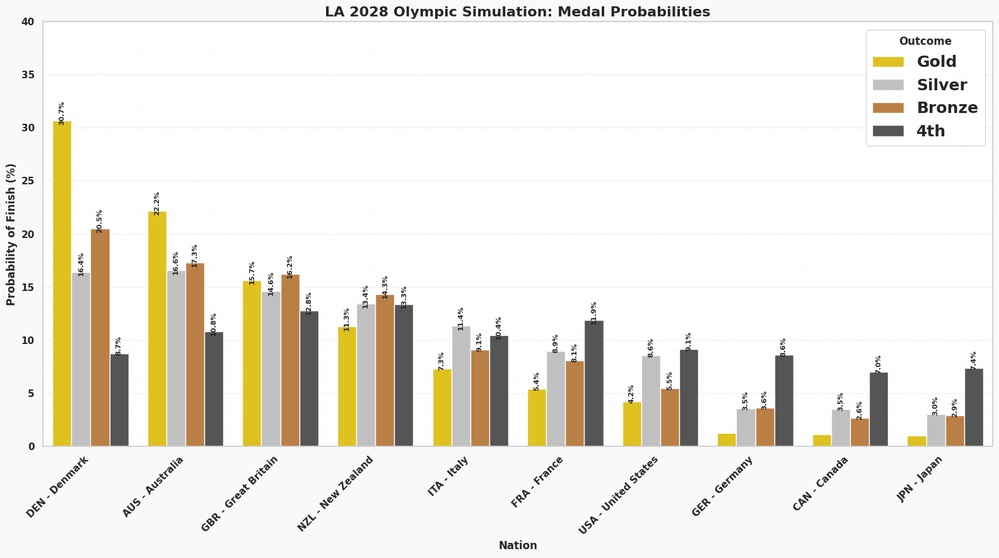

In [35]:
# Prepare data specifically from the true Olympic format results
prob_cols = ['Gold_Prob', 'Silver_Prob', 'Bronze_Prob', '4th_Prob']
plot_data_final = olympic_sim_results[prob_cols].stack().reset_index()
plot_data_final.columns = ['Nation', 'Medal_Type', 'Probability']

# Map medal types to better labels and categorical order
medal_labels = {
    'Gold_Prob': 'Gold',
    'Silver_Prob': 'Silver',
    'Bronze_Prob': 'Bronze',
    '4th_Prob': '4th'
}
plot_data_final['Medal_Type'] = pd.Categorical(
    plot_data_final['Medal_Type'].map(medal_labels),
    categories=['Gold', 'Silver', 'Bronze', '4th'],
    ordered=True
)

# Visualisation
plt.figure(figsize=(16, 9), facecolor='#f8f9fa')
ax = plt.gca()

# Maintain sorting by Gold Probability
nation_order_final = olympic_sim_results.index.tolist()

sns.barplot(
    data=plot_data_final,
    x='Nation',
    y='Probability',
    hue='Medal_Type',
    palette={'Gold': '#FFD700', 'Silver': '#C0C0C0', 'Bronze': '#CD7F32', '4th': '#555555'},
    order=nation_order_final,
    ax=ax
)

plt.title('LA 2028 Olympic Simulation: Medal Probabilities', fontsize=16, fontweight='bold')
plt.xlabel('Nation', fontsize=12, fontweight='bold')
plt.ylabel('Probability of Finish (%)', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontweight='bold')
plt.yticks(np.arange(0, 41, 5), fontweight='bold')
ax.set_ylim(0, 40)

ax.yaxis.set_major_locator(mticker.MultipleLocator(5))
ax.yaxis.set_minor_locator(mticker.MultipleLocator(1))

plt.grid(axis='y', which='major', linestyle='--', alpha=0.4)
plt.grid(axis='y', which='minor', linestyle=':', alpha=0.2)

legend = plt.legend(title='Outcome', loc='best', fontsize=18, frameon=True)
legend.get_title().set_fontweight('bold')
for text in legend.get_texts():
    text.set_fontweight('bold')

# Add probability labels on top of bars for the primary contenders
for p in ax.patches:
    if p.get_height() > 1.5:
        ax.annotate(f'{p.get_height():.1f}%',
                       (p.get_x() + p.get_width() / 2., p.get_height()),
                       ha='center', va='center',
                       xytext=(0, 9),
                       textcoords='offset points',
                       fontsize=8,
                       rotation=90,
                       fontweight='bold')

plt.tight_layout()
plt.savefig('Cycling_Medal_Prediction.png')
plt.show()

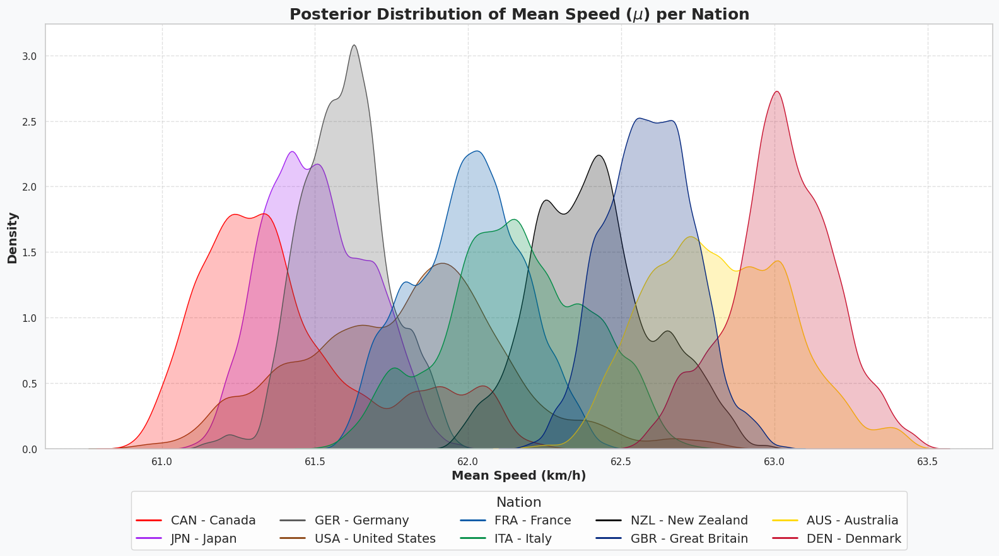

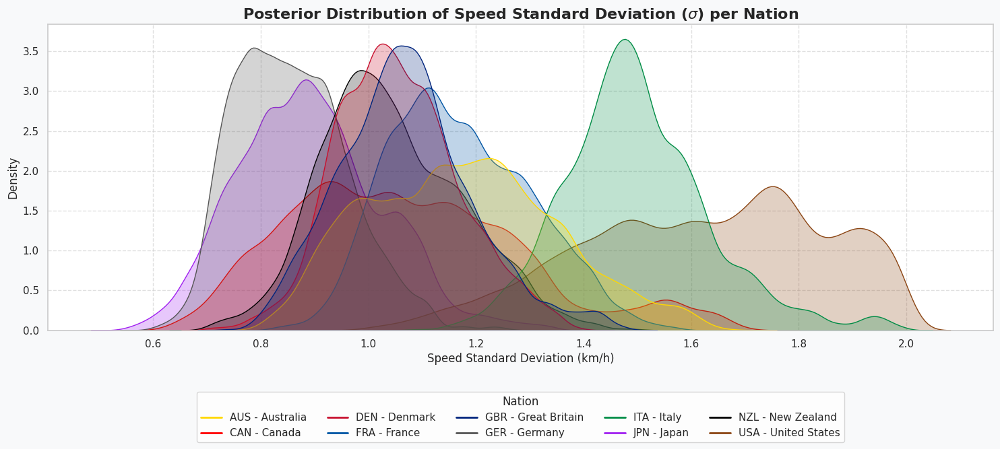

In [39]:
mcmc_data_for_plot = []
for nation, samples in mcmc_samples.items():
    df_nation = pd.DataFrame(samples, columns=['mu', 'sigma'])
    df_nation['Nation'] = nation
    mcmc_data_for_plot.append(df_nation)

mcmc_df_full = pd.concat(mcmc_data_for_plot)

mcmc_df_melted = mcmc_df_full.melt(id_vars=['Nation'], var_name='Parameter', value_name='Value')

fig_mu, ax_mu = plt.subplots(figsize=(16, 9), facecolor='#f8f9fa')

sns.kdeplot(data=mcmc_df_melted[mcmc_df_melted['Parameter'] == 'mu'],
            x='Value', hue='Nation', palette=TEAM_COLORS_HEX, ax=ax_mu, fill=True, common_norm=False)
ax_mu.set_title(r'Posterior Distribution of Mean Speed ($\mu$) per Nation', fontsize=18, fontweight='bold')
ax_mu.set_xlabel('Mean Speed (km/h)', fontsize=14, fontweight='bold')
ax_mu.set_ylabel('Density', fontsize=14, fontweight='bold')
ax_mu.grid(True, linestyle='--', alpha=0.6)

sorted_nations_by_mu = mcmc_df_melted[mcmc_df_melted['Parameter'] == 'mu'].groupby('Nation')['Value'].mean().sort_values().index.tolist()
handles_mu = [Line2D([0], [0], color=TEAM_COLORS_HEX[nation], lw=2, label=nation) for nation in sorted_nations_by_mu]
legend = ax_mu.legend(handles=handles_mu, title='Nation', bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=5, borderaxespad=0., fontsize=14, title_fontsize=16) # Increased legend font sizes
legend.get_title().set_fontweight('normal')
for text in legend.get_texts():
    text.set_fontweight('normal')

plt.tight_layout()
plt.savefig('MCMC_Posterior_Mean_Speed.png')
plt.show()

fig_sigma, ax_sigma = plt.subplots(figsize=(15, 7), facecolor='#f8f9fa')

sns.kdeplot(data=mcmc_df_melted[mcmc_df_melted['Parameter'] == 'sigma'],
            x='Value', hue='Nation', palette=TEAM_COLORS_HEX, ax=ax_sigma, fill=True, common_norm=False)
ax_sigma.set_title(r'Posterior Distribution of Speed Standard Deviation ($\sigma$) per Nation', fontsize=16, fontweight='bold')
ax_sigma.set_xlabel('Speed Standard Deviation (km/h)', fontsize=12)
ax_sigma.set_ylabel('Density', fontsize=12)
ax_sigma.grid(True, linestyle='--', alpha=0.6)

handles_sigma = [Line2D([0], [0], color=TEAM_COLORS_HEX[nation], lw=2, label=nation) for nation in sorted(mcmc_df_melted['Nation'].unique())]
legend_sigma = ax_sigma.legend(handles=handles_sigma, title='Nation', bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=5, borderaxespad=0.)
legend_sigma.get_title().set_fontweight('normal')

plt.tight_layout()
plt.savefig('MCMC_Posterior_Speed_Std_Dev.png')
plt.show()

Simulating with GBR performance gain: 0.5%


Olympic Simulation Results with GBR Performance Gain:


,Gold_Prob,Silver_Prob,Bronze_Prob,4th_Prob
DEN - Denmark,28.71,17.19,19.73,8.92
GBR - Great Britain,23.89,17.17,18.83,11.10
AUS - Australia,19.51,16.21,17.54,11.35
NZL - New Zealand,9.45,13.00,14.34,14.21
ITA - Italy,7.05,10.63,7.95,10.38
FRA - France,4.78,8.65,7.82,12.33
USA - United States,3.87,7.62,5.40,9.51
GER - Germany,1.05,3.29,3.33,8.44
CAN - Canada,0.92,3.27,2.68,6.44
JPN - Japan,0.77,2.97,2.38,7.32


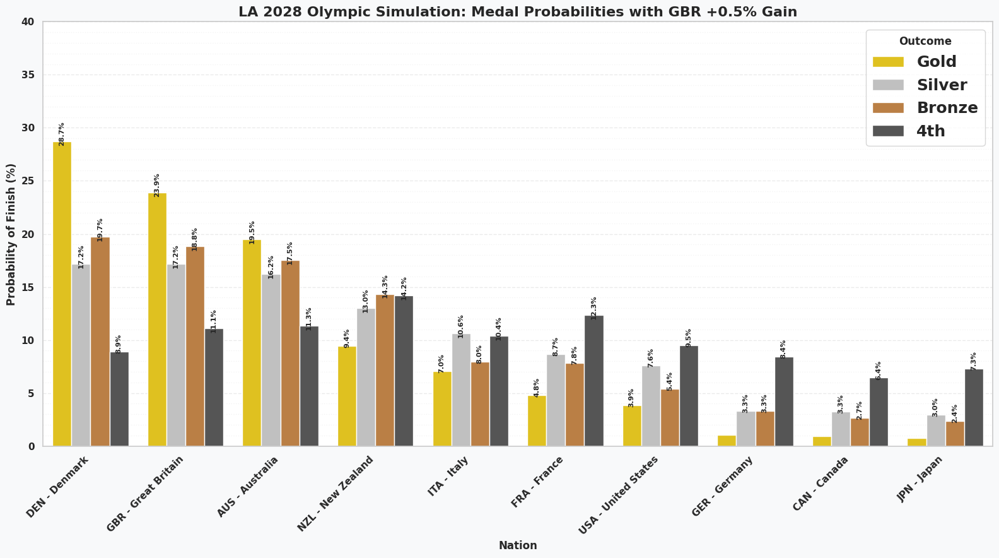

In [37]:
# Define the performance gain for GBR (as a percentage)
performance_gain_gbr_percent = 0.5

print(f"Simulating with GBR performance gain: {performance_gain_gbr_percent}%\n")

# Redefine simulate_race_mcmc to incorporate the performance gain
def simulate_race_mcmc_with_gain(competing_nations, mcmc_samples_dict, performance_gain_percent=0.0):
    race_results = []
    for nation in competing_nations:
        # Draw a mu and sigma for this race simulation from the MCMC posterior samples
        # We randomly pick one (mu, sigma) pair from the posterior samples
        sampled_params = mcmc_samples_dict[nation][np.random.randint(0, len(mcmc_samples_dict[nation]))]
        base_speed_mu, speed_std_dev = sampled_params

        # Apply performance gain for GBR
        if nation == 'GBR - Great Britain':
            base_speed_mu = base_speed_mu * (1 + performance_gain_percent / 100)

        # Introduce race-day randomness using the sampled mean and std dev
        simulated_speed = np.random.normal(base_speed_mu, speed_std_dev)

        # Ensure speed is realistic
        simulated_speed = max(simulated_speed, 40.0)

        # Calculate simulated time for 4000m (4km)
        simulated_time = (4 / simulated_speed) * 3600 # Time in seconds
        race_results.append({'Nation': nation, 'Time_Sec': simulated_time})

    # Sort results by time (lowest time is best)
    ranked_results = sorted(race_results, key=lambda x: x['Time_Sec'])
    return ranked_results

# Redefine run_true_olympic_simulation to use the new simulate_race_mcmc_with_gain
def run_true_olympic_simulation_with_gain(num_iterations, mcmc_samples_dict, nations, performance_gain_percent=0.0):
    stats = {n: {'Gold': 0, 'Silver': 0, 'Bronze': 0, '4th': 0, 'Finals_Reached': 0} for n in nations}

    for _ in range(num_iterations):
        # 1. QUALIFYING ROUND (Solo efforts)
        qual_results = simulate_race_mcmc_with_gain(nations, mcmc_samples_dict, performance_gain_percent)
        qualifiers = [res['Nation'] for res in qual_results[:8]]
        eliminated_qual = [res['Nation'] for res in qual_results[8:]]

        # 2. FIRST ROUND (Heats)
        # Heat 1: 6th vs 7th
        # Heat 2: 5th vs 8th
        # Heat 3: 2nd vs 3rd (Winner to Gold)
        # Heat 4: 1st vs 4th (Winner to Gold)

        h1_res = simulate_race_mcmc_with_gain([qualifiers[5], qualifiers[6]], mcmc_samples_dict, performance_gain_percent)
        h2_res = simulate_race_mcmc_with_gain([qualifiers[4], qualifiers[7]], mcmc_samples_dict, performance_gain_percent)
        h3_res = simulate_race_mcmc_with_gain([qualifiers[1], qualifiers[2]], mcmc_samples_dict, performance_gain_percent)
        h4_res = simulate_race_mcmc_with_gain([qualifiers[0], qualifiers[3]], mcmc_samples_dict, performance_gain_percent)

        # Winners of top-tier heats go to Gold Final
        gold_finalists = [h4_res[0]['Nation'], h3_res[0]['Nation']]

        # All others go into the 'Time Pool' for Bronze and Classifications
        # Pool includes: Top-tier losers and all lower-tier teams
        pool = [
            h4_res[1], h3_res[1], # Top tier losers
            h1_res[0], h1_res[1], # Heat 1 both
            h2_res[0], h2_res[1]  # Heat 2 both
        ]
        pool_sorted = sorted(pool, key=lambda x: x['Time_Sec'])

        bronze_finalists = [pool_sorted[0]['Nation'], pool_sorted[1]['Nation']]
        final_5_6 = [pool_sorted[2]['Nation'], pool_sorted[3]['Nation']]
        final_7_8 = [pool_sorted[4]['Nation'], pool_sorted[5]['Nation']]

        # 3. FINALS
        gold_res = simulate_race_mcmc_with_gain(gold_finalists, mcmc_samples_dict, performance_gain_percent)
        bronze_res = simulate_race_mcmc_with_gain(bronze_finalists, mcmc_samples_dict, performance_gain_percent)
        f56_res = simulate_race_mcmc_with_gain(final_5_6, mcmc_samples_dict, performance_gain_percent)
        f78_res = simulate_race_mcmc_with_gain(final_7_8, mcmc_samples_dict, performance_gain_percent)

        # Combine all into final ranking
        final_ranking = [
            gold_res[0]['Nation'], gold_res[1]['Nation'],   # 1, 2
            bronze_res[0]['Nation'], bronze_res[1]['Nation'], # 3, 4
            f56_res[0]['Nation'], f56_res[1]['Nation'],     # 5, 6
            f78_res[0]['Nation'], f78_res[1]['Nation'],     # 7, 8
            eliminated_qual[0], eliminated_qual[1]          # 9, 10
        ]

        stats[final_ranking[0]]['Gold'] += 1
        stats[final_ranking[1]]['Silver'] += 1
        stats[final_ranking[2]]['Bronze'] += 1
        stats[final_ranking[3]]['4th'] += 1

        # In Olympic terms, 'Finals' is the medal rounds
        stats[final_ranking[0]]['Finals_Reached'] += 1
        stats[final_ranking[1]]['Finals_Reached'] += 1
        stats[final_ranking[2]]['Finals_Reached'] += 1
        stats[final_ranking[3]]['Finals_Reached'] += 1

    return pd.DataFrame.from_dict(stats, orient='index')

# Run the simulation with the specified performance gain
num_simulation_iterations = 10000
olympic_sim_results_gbr_gain = run_true_olympic_simulation_with_gain(num_simulation_iterations, mcmc_samples, target_nations, performance_gain_gbr_percent)

# Calculate Percentages
for col in ['Gold', 'Silver', 'Bronze', '4th']:
    olympic_sim_results_gbr_gain[f'{col}_Prob'] = (olympic_sim_results_gbr_gain[col] / num_simulation_iterations * 100).round(2)

olympic_sim_results_gbr_gain = olympic_sim_results_gbr_gain.sort_values('Gold_Prob', ascending=False)
print("\nOlympic Simulation Results with GBR Performance Gain:")
display(olympic_sim_results_gbr_gain[['Gold_Prob', 'Silver_Prob', 'Bronze_Prob', '4th_Prob']])

# Prepare data specifically from the true Olympic format results with gain
prob_cols = ['Gold_Prob', 'Silver_Prob', 'Bronze_Prob', '4th_Prob']
plot_data_gbr_gain = olympic_sim_results_gbr_gain[prob_cols].stack().reset_index()
plot_data_gbr_gain.columns = ['Nation', 'Medal_Type', 'Probability']

# Map medal types to better labels and categorical order
medal_labels = {
    'Gold_Prob': 'Gold',
    'Silver_Prob': 'Silver',
    'Bronze_Prob': 'Bronze',
    '4th_Prob': '4th'
}
plot_data_gbr_gain['Medal_Type'] = pd.Categorical(
    plot_data_gbr_gain['Medal_Type'].map(medal_labels),
    categories=['Gold', 'Silver', 'Bronze', '4th'],
    ordered=True
)

# Visualisation
plt.figure(figsize=(16, 9), facecolor='#f8f9fa')
ax = plt.gca()

# Maintain sorting by Gold Probability from the new simulation results
nation_order_gbr_gain = olympic_sim_results_gbr_gain.index.tolist()

sns.barplot(
    data=plot_data_gbr_gain,
    x='Nation',
    y='Probability',
    hue='Medal_Type',
    palette={'Gold': '#FFD700', 'Silver': '#C0C0C0', 'Bronze': '#CD7F32', '4th': '#555555'},
    order=nation_order_gbr_gain,
    ax=ax
)

plt.title(f'LA 2028 Olympic Simulation: Medal Probabilities with GBR +{performance_gain_gbr_percent}% Gain', fontsize=16, fontweight='bold')
plt.xlabel('Nation', fontsize=12, fontweight='bold')
plt.ylabel('Probability of Finish (%)', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontweight='bold')
plt.yticks(np.arange(0, 41, 5), fontweight='bold')
ax.set_ylim(0, 40)

ax.yaxis.set_major_locator(mticker.MultipleLocator(5))
ax.yaxis.set_minor_locator(mticker.MultipleLocator(1))

plt.grid(axis='y', which='major', linestyle='--', alpha=0.4)
plt.grid(axis='y', which='minor', linestyle=':', alpha=0.2)

legend = plt.legend(title='Outcome', loc='best', fontsize=18, frameon=True)
legend.get_title().set_fontweight('bold')
for text in legend.get_texts():
    text.set_fontweight('bold')

# Add probability labels on top of bars for the primary contenders
for p in ax.patches:
    if p.get_height() > 1.5:
        ax.annotate(f'{p.get_height():.1f}%',
                       (p.get_x() + p.get_width() / 2., p.get_height()),
                       ha='center', va='center',
                       xytext=(0, 9),
                       textcoords='offset points',
                       fontsize=8,
                       rotation=90,
                       fontweight='bold')

plt.tight_layout()
plt.savefig(f'Cycling_Medal_Prediction_GBR_Gain_{performance_gain_gbr_percent}.png')
plt.show()

Simulating with GBR performance gain: 1.0%


Olympic Simulation Results with GBR Performance Gain:


,Gold_Prob,Silver_Prob,Bronze_Prob,4th_Prob
GBR - Great Britain,34.49,16.79,20.17,8.25
DEN - Denmark,25.01,19.11,20.04,9.85
AUS - Australia,18.15,16.86,17.35,11.69
NZL - New Zealand,7.94,13.20,13.82,14.83
ITA - Italy,5.46,10.36,8.30,11.58
FRA - France,3.56,8.34,7.29,12.86
USA - United States,3.26,7.76,5.28,9.78
GER - Germany,0.82,2.60,2.96,7.60
JPN - Japan,0.78,2.30,2.35,6.98
CAN - Canada,0.53,2.68,2.44,6.58


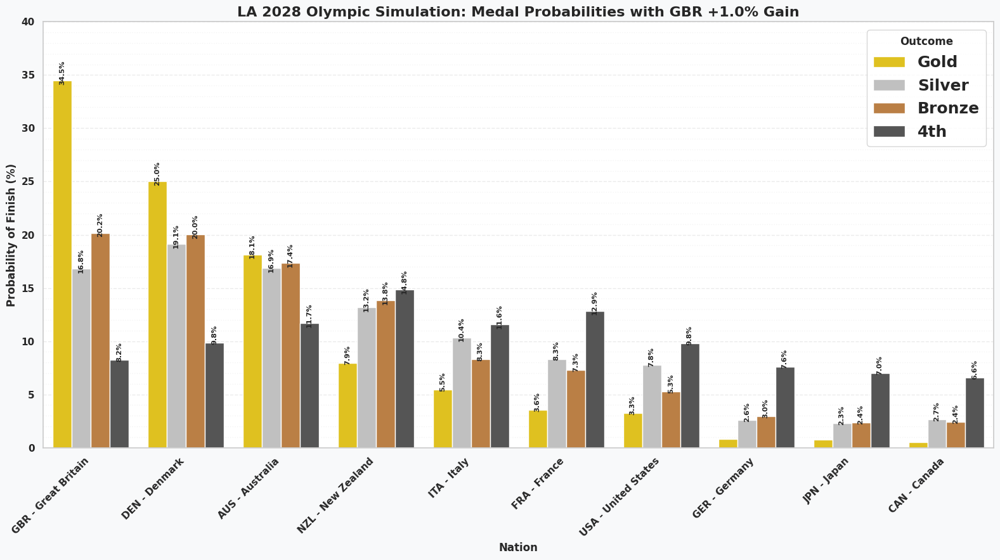

In [38]:
# Define the performance gain for GBR (as a percentage)
performance_gain_gbr_percent = 1.0

print(f"Simulating with GBR performance gain: {performance_gain_gbr_percent}%\n")

# Run the simulation with the specified performance gain
num_simulation_iterations = 10000
olympic_sim_results_gbr_gain = run_true_olympic_simulation_with_gain(num_simulation_iterations, mcmc_samples, target_nations, performance_gain_gbr_percent)

# Calculate Percentages
for col in ['Gold', 'Silver', 'Bronze', '4th']:
    olympic_sim_results_gbr_gain[f'{col}_Prob'] = (olympic_sim_results_gbr_gain[col] / num_simulation_iterations * 100).round(2)

olympic_sim_results_gbr_gain = olympic_sim_results_gbr_gain.sort_values('Gold_Prob', ascending=False)
print("\nOlympic Simulation Results with GBR Performance Gain:")
display(olympic_sim_results_gbr_gain[['Gold_Prob', 'Silver_Prob', 'Bronze_Prob', '4th_Prob']])

# Prepare data specifically from the true Olympic format results with gain
prob_cols = ['Gold_Prob', 'Silver_Prob', 'Bronze_Prob', '4th_Prob']
plot_data_gbr_gain = olympic_sim_results_gbr_gain[prob_cols].stack().reset_index()
plot_data_gbr_gain.columns = ['Nation', 'Medal_Type', 'Probability']

# Map medal types to better labels and categorical order
medal_labels = {
    'Gold_Prob': 'Gold',
    'Silver_Prob': 'Silver',
    'Bronze_Prob': 'Bronze',
    '4th_Prob': '4th'
}
plot_data_gbr_gain['Medal_Type'] = pd.Categorical(
    plot_data_gbr_gain['Medal_Type'].map(medal_labels),
    categories=['Gold', 'Silver', 'Bronze', '4th'],
    ordered=True
)

# Visualisation
plt.figure(figsize=(16, 9), facecolor='#f8f9fa')
ax = plt.gca()

# Maintain sorting by Gold Probability from the new simulation results
nation_order_gbr_gain = olympic_sim_results_gbr_gain.index.tolist()

sns.barplot(
    data=plot_data_gbr_gain,
    x='Nation',
    y='Probability',
    hue='Medal_Type',
    palette={'Gold': '#FFD700', 'Silver': '#C0C0C0', 'Bronze': '#CD7F32', '4th': '#555555'},
    order=nation_order_gbr_gain,
    ax=ax
)

plt.title(f'LA 2028 Olympic Simulation: Medal Probabilities with GBR +{performance_gain_gbr_percent}% Gain', fontsize=16, fontweight='bold')
plt.xlabel('Nation', fontsize=12, fontweight='bold')
plt.ylabel('Probability of Finish (%)', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontweight='bold')
plt.yticks(np.arange(0, 41, 5), fontweight='bold')
ax.set_ylim(0, 40)

ax.yaxis.set_major_locator(mticker.MultipleLocator(5))
ax.yaxis.set_minor_locator(mticker.MultipleLocator(1))

plt.grid(axis='y', which='major', linestyle='--', alpha=0.4)
plt.grid(axis='y', which='minor', linestyle=':', alpha=0.2)

legend = plt.legend(title='Outcome', loc='best', fontsize=18, frameon=True)
legend.get_title().set_fontweight('bold')
for text in legend.get_texts():
    text.set_fontweight('bold')

# Add probability labels on top of bars for the primary contenders
for p in ax.patches:
    if p.get_height() > 1.5:
        ax.annotate(f'{p.get_height():.1f}%',
                       (p.get_x() + p.get_width() / 2., p.get_height()),
                       ha='center', va='center',
                       xytext=(0, 9),
                       textcoords='offset points',
                       fontsize=8,
                       rotation=90,
                       fontweight='bold')

plt.tight_layout()
plt.savefig(f'Cycling_Medal_Prediction_GBR_Gain_{performance_gain_gbr_percent}.png')
plt.show()